In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns

In [3]:
sns.set_style('whitegrid')
pd.set_option('display.max_columns', 300)

In [4]:
from sklearn.preprocessing import StandardScaler
from sklearn.feature_selection import RFE
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split, StratifiedKFold
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, roc_auc_score, log_loss, r2_score
from yellowbrick.classifier import ROCAUC
from sklearn import tree
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

In [5]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [6]:
from tqdm import tqdm

In [7]:
import pickle

In [8]:
def get_artist_info(artist_id):
    """obtain artist info for the given artist"""

    # return artist data if available
    try:
        artist_info = sp.artist(artist_id)
        return artist_info
    except:
        return float('NaN')

In [9]:
spotify_df = pd.read_csv('dataset.csv', encoding='latin1')

In [10]:
spotify_df.head(10)

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


In [11]:
spotify_df.drop('Unnamed: 0',axis=1,inplace=True)

In [12]:
spotify_df.head(10)

,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4,acoustic
1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4,acoustic
2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4,acoustic
3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3,acoustic
4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4,acoustic
5,01MVOl9KtVTNfFiBU9I7dc,Tyrone Wells,Days I Will Remember,Days I Will Remember,58,214240,False,0.688,0.4810,6,-8.807,1,0.1050,0.2890,0.000000,0.1890,0.6660,98.017,4,acoustic
6,6Vc5wAMmXdKIAM7WUoEb7N,A Great Big World;Christina Aguilera,Is There Anybody Out There?,Say Something,74,229400,False,0.407,0.1470,2,-8.822,1,0.0355,0.8570,0.000003,0.0913,0.0765,141.284,3,acoustic
7,1EzrEOXmMH3G43AXT1y7pA,Jason Mraz,We Sing. We Dance. We Steal Things.,I'm Yours,80,242946,False,0.703,0.4440,11,-9.331,1,0.0417,0.5590,0.000000,0.0973,0.7120,150.960,4,acoustic
8,0IktbUcnAGrvD03AWnz3Q8,Jason Mraz;Colbie Caillat,We Sing. We Dance. We Steal Things.,Lucky,74,189613,False,0.625,0.4140,0,-8.700,1,0.0369,0.2940,0.000000,0.1510,0.6690,130.088,4,acoustic
9,7k9GuJYLp2AzqokyEdwEw2,Ross Copperman,Hunger,Hunger,56,205594,False,0.442,0.6320,1,-6.770,1,0.0295,0.4260,0.004190,0.0735,0.1960,78.899,4,acoustic


In [13]:
spotify_df.shape

(114000, 20)

In [14]:
spotify_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          114000 non-null  object 
 1   artists           113999 non-null  object 
 2   album_name        113999 non-null  object 
 3   track_name        113999 non-null  object 
 4   popularity        114000 non-null  int64  
 5   duration_ms       114000 non-null  int64  
 6   explicit          114000 non-null  bool   
 7   danceability      114000 non-null  float64
 8   energy            114000 non-null  float64
 9   key               114000 non-null  int64  
 10  loudness          114000 non-null  float64
 11  mode              114000 non-null  int64  
 12  speechiness       114000 non-null  float64
 13  acousticness      114000 non-null  float64
 14  instrumentalness  114000 non-null  float64
 15  liveness          114000 non-null  float64
 16  valence           11

In [15]:
spotify_df.describe()

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
count,114000.000000,1.140000e+05,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000,114000.000000
mean,33.238535,2.280292e+05,0.566800,0.641383,5.309140,-8.258960,0.637553,0.084652,0.314910,0.156050,0.213553,0.474068,122.147837,3.904035
std,22.305078,1.072977e+05,0.173542,0.251529,3.559987,5.029337,0.480709,0.105732,0.332523,0.309555,0.190378,0.259261,29.978197,0.432621
min,0.000000,0.000000e+00,0.000000,0.000000,0.000000,-49.531000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,17.000000,1.740660e+05,0.456000,0.472000,2.000000,-10.013000,0.000000,0.035900,0.016900,0.000000,0.098000,0.260000,99.218750,4.000000
50%,35.000000,2.129060e+05,0.580000,0.685000,5.000000,-7.004000,1.000000,0.048900,0.169000,0.000042,0.132000,0.464000,122.017000,4.000000
75%,50.000000,2.615060e+05,0.695000,0.854000,8.000000,-5.003000,1.000000,0.084500,0.598000,0.049000,0.273000,0.683000,140.071000,4.000000
max,100.000000,5.237295e+06,0.985000,1.000000,11.000000,4.532000,1.000000,0.965000,0.996000,1.000000,1.000000,0.995000,243.372000,5.000000


In [16]:
# Check for duplicate rows
duplicate_rows = spotify_df[spotify_df.duplicated()]

# Display duplicate rows
print("Duplicate Rows except first occurrence:")
print(duplicate_rows)

Duplicate Rows except first occurrence:
                      track_id                  artists  \
1925    0CDucx9lKxuCZplLXUz0iX   Buena Onda Reggae Club   
2155    2aibwv5hGXSgw7Yru8IYTO    Red Hot Chili Peppers   
3738    7mULVp0DJrI2Nd6GesLvxn             Joy Division   
4648    6d3RIvHfVkoOtW1WHXmbX3          Little Symphony   
5769    481beimUiUnMUzSbOAFcUT             SUPER BEAVER   
...                        ...                      ...   
111246  0sSjIvTvd6fUSZZ5rnTPDW  Everything But The Girl   
111362  2zg3iJW4fK7KZgHOvJU67z                Faithless   
111980  46FPub2Fewe7XrgM0smTYI                Morcheeba   
112968  6qVA1MqDrDKfk9144bhoKp              Acil Servis   
113345  5WaioelSGekDk3UNQy8zaw              Matt Redman   

                                              album_name  \
1925                                             Disco 2   
2155                                    Stadium Arcadium   
3738                                  Timeless Rock Hits   
4648       

In [17]:
spotify_df = spotify_df.drop_duplicates()

In [18]:
spotify_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 113550 entries, 0 to 113999
Data columns (total 20 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   track_id          113550 non-null  object 
 1   artists           113549 non-null  object 
 2   album_name        113549 non-null  object 
 3   track_name        113549 non-null  object 
 4   popularity        113550 non-null  int64  
 5   duration_ms       113550 non-null  int64  
 6   explicit          113550 non-null  bool   
 7   danceability      113550 non-null  float64
 8   energy            113550 non-null  float64
 9   key               113550 non-null  int64  
 10  loudness          113550 non-null  float64
 11  mode              113550 non-null  int64  
 12  speechiness       113550 non-null  float64
 13  acousticness      113550 non-null  float64
 14  instrumentalness  113550 non-null  float64
 15  liveness          113550 non-null  float64
 16  valence           11

In [19]:
def get_missing_report(df):
    missing_df = (df.isnull().sum()/len(df)).rename_axis('columns').to_frame('missing_perc').reset_index()
    missing_df['missing_perc'] = missing_df['missing_perc'] * 100
    missing_df['type'] = missing_df['columns'].apply(lambda col: str(df[col].dtypes))
    return missing_df.sort_values(by = 'missing_perc', ascending=False)

In [20]:
missing_data = get_missing_report(spotify_df)
missing_data

,columns,missing_perc,type
2,album_name,0.000881,object
3,track_name,0.000881,object
1,artists,0.000881,object
0,track_id,0.000000,object
12,speechiness,0.000000,float64
18,time_signature,0.000000,int64
17,tempo,0.000000,float64
16,valence,0.000000,float64
15,liveness,0.000000,float64
14,instrumentalness,0.000000,float64


In [21]:
missing_columns = ['album_name','track_name','artists']
for column in missing_columns:
    spotify_df[column] = spotify_df[column].fillna('missing')

In [22]:
missing_data = get_missing_report(spotify_df)
missing_data

,columns,missing_perc,type
0,track_id,0.0,object
1,artists,0.0,object
18,time_signature,0.0,int64
17,tempo,0.0,float64
16,valence,0.0,float64
15,liveness,0.0,float64
14,instrumentalness,0.0,float64
13,acousticness,0.0,float64
12,speechiness,0.0,float64
11,mode,0.0,int64


In [23]:
numerical_columns = spotify_df.select_dtypes(include=['number']).columns.tolist()

print(numerical_columns)
len(numerical_columns)

['popularity', 'duration_ms', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'time_signature']


14

In [24]:
spotify_df.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre'],
      dtype='object')

In [25]:
numerical_df = spotify_df[numerical_columns]

#### Basic distribution

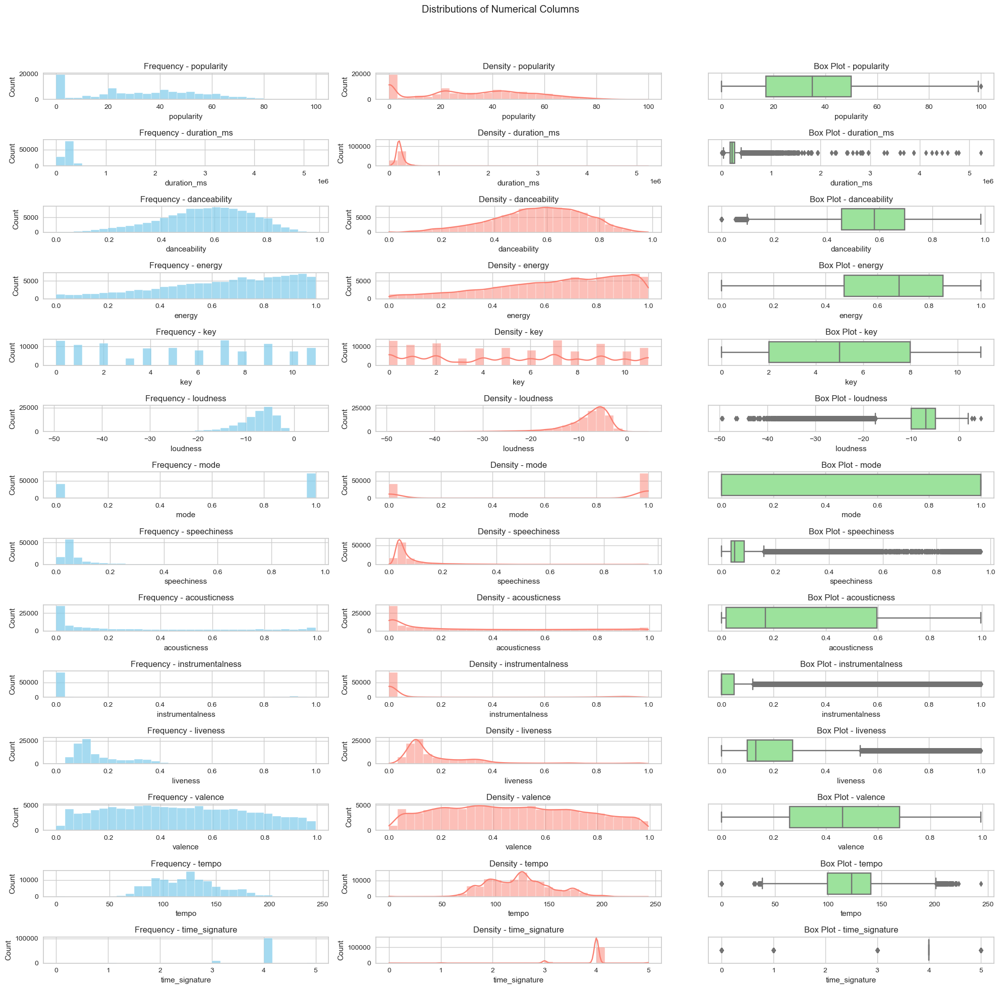

In [142]:
# Set up the figure and axes for subplots
fig, axes = plt.subplots(nrows=14, ncols=3, figsize=(20, 20))
fig.suptitle('Distributions of Numerical Columns')

# Plot frequency histograms
for i, col in enumerate(numerical_df.columns):
    sns.histplot(data=numerical_df, x=col, kde=False, ax=axes[i, 0], color='skyblue', bins=30)
    axes[i, 0].set_title(f'Frequency - {col}')

# Plot density histograms
for i, col in enumerate(numerical_df.columns):
    sns.histplot(data=numerical_df, x=col, kde=True, ax=axes[i, 1], color='salmon', bins=30)
    axes[i, 1].set_title(f'Density - {col}')

# Plot box plots
for i, col in enumerate(numerical_df.columns):
    sns.boxplot(x=numerical_df[col], ax=axes[i, 2], color='lightgreen')
    axes[i, 2].set_title(f'Box Plot - {col}')

plt.tight_layout(rect=[0, 0.0, 1, 0.95])
plt.show()

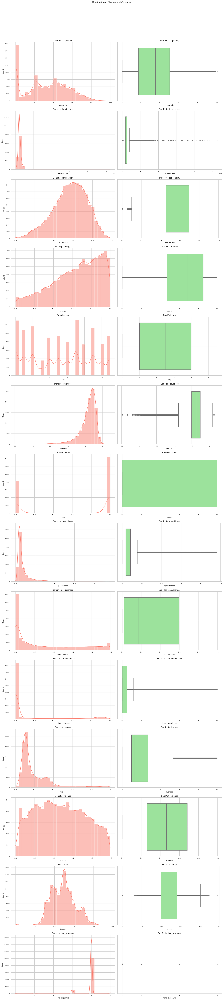

In [143]:
# Set up the figure and axes for subplots
fig, axes = plt.subplots(nrows=len(numerical_df.columns), ncols=2, figsize=(18, 6*len(numerical_df.columns)))
fig.suptitle('Distributions of Numerical Columns')

# Plot frequency histograms, density histograms, and box plots
for i, col in enumerate(numerical_df.columns):
    # sns.histplot(data=numerical_df, x=col, kde=False, ax=axes[i, 0], color='skyblue', bins=30)
    # axes[i, 0].set_title(f'Frequency - {col}')

    sns.histplot(data=numerical_df, x=col, kde=True, ax=axes[i, 0], color='salmon', bins=30)
    axes[i, 0].set_title(f'Density - {col}')

    sns.boxplot(x=numerical_df[col], ax=axes[i, 1], color='lightgreen')
    axes[i, 1].set_title(f'Box Plot - {col}')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [144]:
spotify_df['popularity'].describe()

count    113550.000000
mean         33.324139
std          22.283976
min           0.000000
25%          17.000000
50%          35.000000
75%          50.000000
max         100.000000
Name: popularity, dtype: float64

#### Defining popularity classes

In [26]:
# Assuming 'popularity_score' is the column in the DataFrame 'spotify_df'
# Adjust the percentiles and thresholds based on your data distribution
low_threshold = spotify_df['popularity'].quantile(0.25)
medium_threshold = spotify_df['popularity'].quantile(0.90)

spotify_df['popularity_class'] = pd.cut(
    spotify_df['popularity'],
    bins=[-float('inf'), low_threshold, medium_threshold, float('inf')],
    labels=['Low', 'Medium', 'High'],
    include_lowest=True
)

In [27]:
low_threshold

17.0

In [28]:
medium_threshold

63.0

In [29]:
spotify_df['popularity_class'].value_counts(normalize=True)

Medium    0.655887
Low       0.252514
High      0.091598
Name: popularity_class, dtype: float64

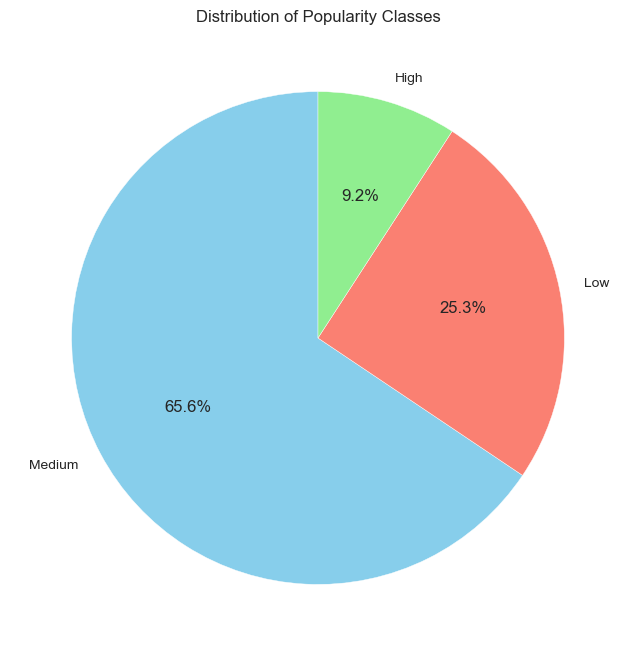

In [30]:
# Assuming 'spotify_df' is your DataFrame
popularity_counts = spotify_df['popularity_class'].value_counts(normalize=True)

# Create a pie chart
plt.figure(figsize=(8, 8))
popularity_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=['skyblue', 'salmon', 'lightgreen'])
plt.title('Distribution of Popularity Classes')
plt.ylabel('')  # Remove the default 'count' label on the y-axis
plt.show()

In [31]:
numerical_df

,popularity,duration_ms,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature
0,73,230666,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.7150,87.917,4
1,55,149610,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.2670,77.489,4
2,57,210826,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.1200,76.332,4
3,71,201933,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.1430,181.740,3
4,82,198853,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.1670,119.949,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
113995,21,384999,0.172,0.2350,5,-16.393,1,0.0422,0.6400,0.928000,0.0863,0.0339,125.995,5
113996,22,385000,0.174,0.1170,0,-18.318,0,0.0401,0.9940,0.976000,0.1050,0.0350,85.239,4
113997,22,271466,0.629,0.3290,0,-10.895,0,0.0420,0.8670,0.000000,0.0839,0.7430,132.378,4
113998,41,283893,0.587,0.5060,7,-10.889,1,0.0297,0.3810,0.000000,0.2700,0.4130,135.960,4


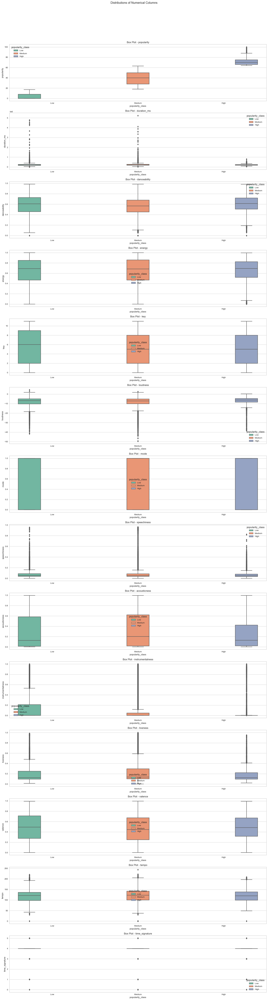

In [150]:
# Set up the figure and axes for subplots
fig, axes = plt.subplots(nrows=len(numerical_df.columns), ncols=1, figsize=(18, 5*len(numerical_df.columns)))
fig.suptitle('Distributions of Numerical Columns')

# Define a color palette for the 'popularity_class'
palette = sns.color_palette("Set2", len(spotify_df['popularity_class'].unique()))

# Plot boxplots for each numerical column with different colors for each 'popularity_class'
for i, col in enumerate(numerical_df.columns):
    sns.boxplot(y=col, ax=axes[i], color='lightgreen', x='popularity_class', data=spotify_df, hue='popularity_class', palette=palette)
    axes[i].set_title(f'Box Plot - {col}')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

In [151]:
spotify_df['track_genre'].value_counts()

acoustic       1000
emo            1000
rock-n-roll    1000
reggaeton      1000
disco          1000
               ... 
honky-tonk      981
dance           965
german          963
classical       933
romance         904
Name: track_genre, Length: 114, dtype: int64

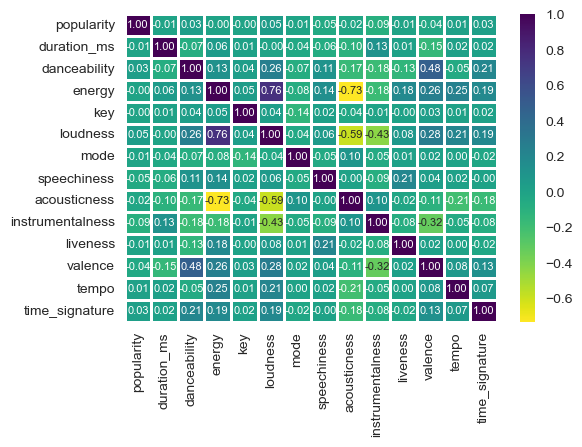

In [108]:
plt.figure(figsize=(6, 4))  # Adjust the height to make it shorter
sns.heatmap(
    numerical_df.corr(),
    cmap='viridis_r',
    annot=True,
    linecolor='white',
    linewidths=0.8,
    fmt=".2f",  # Format the annotations to two decimal places
    annot_kws={"size": 8},  # Adjust the font size of the annotations
)
plt.show()


<Figure size 1200x800 with 0 Axes>

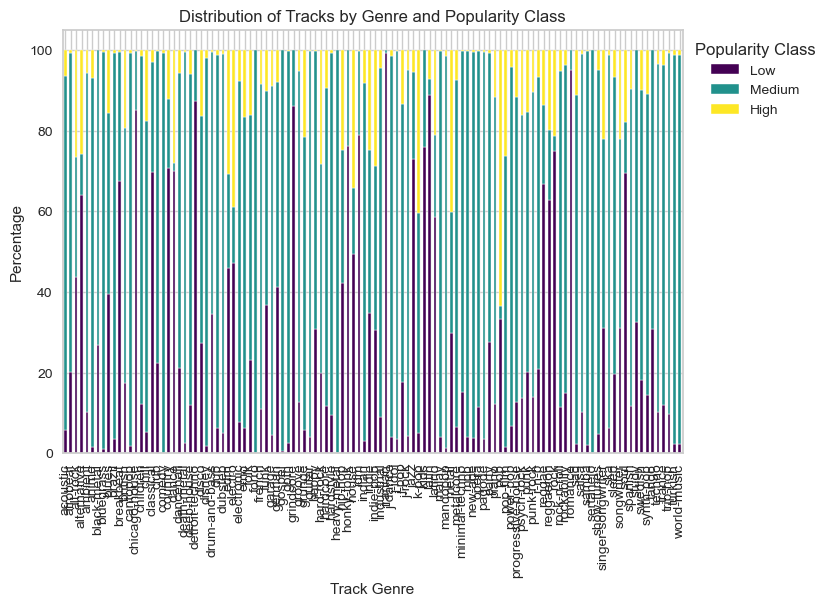

In [153]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming 'spotify_df' is your DataFrame

# Calculate the percentage distribution of tracks for each genre and popularity class
genre_popularity_counts = spotify_df.groupby(['track_genre', 'popularity_class']).size().unstack()
genre_popularity_percentage = genre_popularity_counts.div(genre_popularity_counts.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
plt.figure(figsize=(12, 8))
genre_popularity_percentage.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Distribution of Tracks by Genre and Popularity Class')
plt.xlabel('Track Genre')
plt.ylabel('Percentage')
plt.legend(title='Popularity Class', bbox_to_anchor=(1, 1))
plt.show()

<Figure size 1200x800 with 0 Axes>

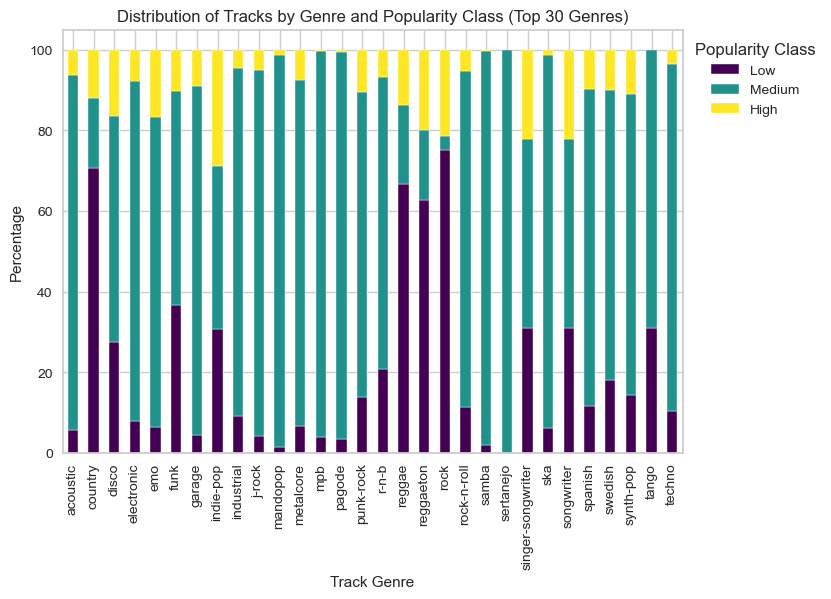

In [154]:
# Calculate the total count of tracks for each genre
genre_counts = spotify_df['track_genre'].value_counts()

# Select the top 20 genres
top_genres = genre_counts.head(30).index

# Filter the DataFrame for the top 20 genres
filtered_df = spotify_df[spotify_df['track_genre'].isin(top_genres)]

# Calculate the percentage distribution of tracks for each genre and popularity class
genre_popularity_counts = filtered_df.groupby(['track_genre', 'popularity_class']).size().unstack()
genre_popularity_percentage = genre_popularity_counts.div(genre_popularity_counts.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
plt.figure(figsize=(12, 8))
genre_popularity_percentage.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Distribution of Tracks by Genre and Popularity Class (Top 30 Genres)')
plt.xlabel('Track Genre')
plt.ylabel('Percentage')
plt.legend(title='Popularity Class', bbox_to_anchor=(1, 1))
plt.show()

<Figure size 1200x800 with 0 Axes>

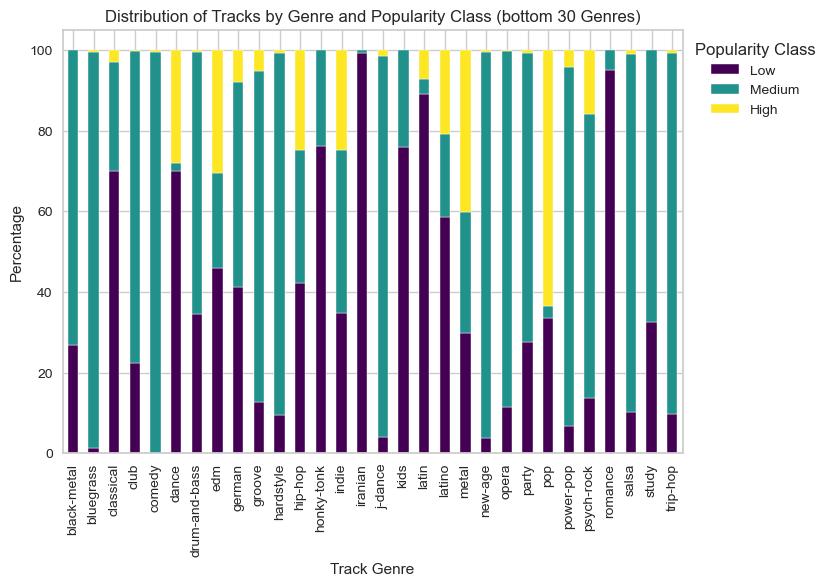

In [155]:
# Calculate the total count of tracks for each genre
genre_counts = spotify_df['track_genre'].value_counts()

# Select the top 20 genres
top_genres = genre_counts.tail(30).index

# Filter the DataFrame for the top 20 genres
filtered_df = spotify_df[spotify_df['track_genre'].isin(top_genres)]

# Calculate the percentage distribution of tracks for each genre and popularity class
genre_popularity_counts = filtered_df.groupby(['track_genre', 'popularity_class']).size().unstack()
genre_popularity_percentage = genre_popularity_counts.div(genre_popularity_counts.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
plt.figure(figsize=(12, 8))
genre_popularity_percentage.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Distribution of Tracks by Genre and Popularity Class (bottom 30 Genres)')
plt.xlabel('Track Genre')
plt.ylabel('Percentage')
plt.legend(title='Popularity Class', bbox_to_anchor=(1, 1))
plt.show()

<Figure size 1200x800 with 0 Axes>

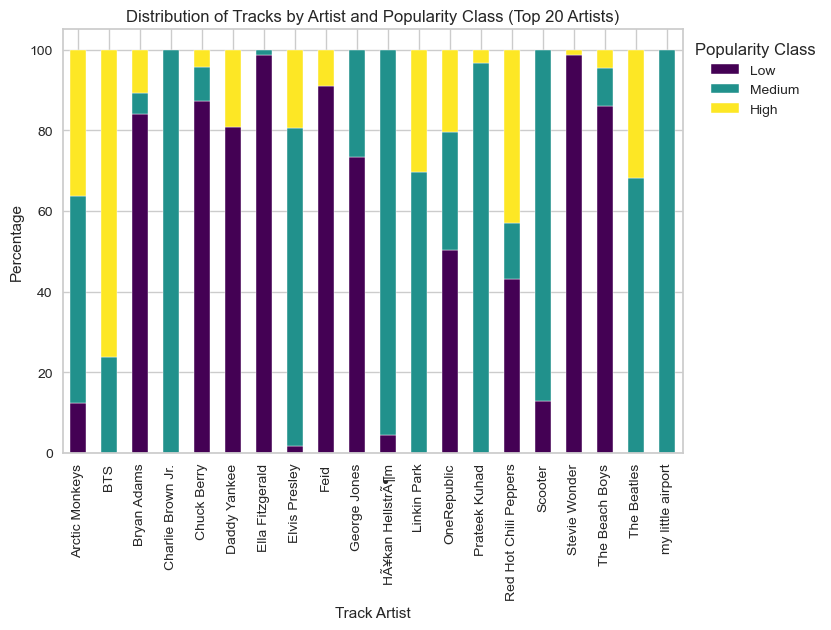

In [156]:
# Calculate the total count of tracks for each artist
artist_counts = spotify_df['artists'].value_counts()

# Select the top 20 artists
top_artists = artist_counts.head(20).index

# Filter the DataFrame for the top 20 artists
filtered_df = spotify_df[spotify_df['artists'].isin(top_artists)]

# Calculate the percentage distribution of tracks for each artist and popularity class
artist_popularity_counts = filtered_df.groupby(['artists', 'popularity_class']).size().unstack()
artist_popularity_percentage = artist_popularity_counts.div(artist_popularity_counts.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
plt.figure(figsize=(12, 8))
artist_popularity_percentage.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Distribution of Tracks by Artist and Popularity Class (Top 20 Artists)')
plt.xlabel('Track Artist')
plt.ylabel('Percentage')
plt.legend(title='Popularity Class', bbox_to_anchor=(1, 1))
plt.show()

<Figure size 1200x800 with 0 Axes>

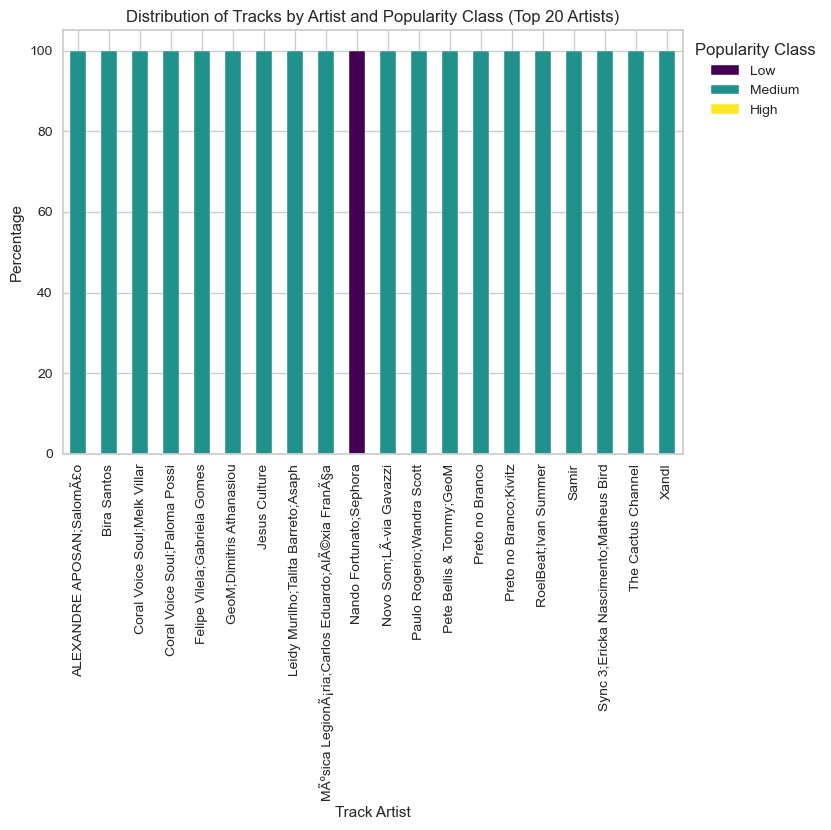

In [109]:
# Calculate the total count of tracks for each artist
artist_counts = spotify_df['artists'].value_counts()

# Select the top 20 artists
top_artists = artist_counts.tail(20).index

# Filter the DataFrame for the top 20 artists
filtered_df = spotify_df[spotify_df['artists'].isin(top_artists)]

# Calculate the percentage distribution of tracks for each artist and popularity class
artist_popularity_counts = filtered_df.groupby(['artists', 'popularity_class']).size().unstack()
artist_popularity_percentage = artist_popularity_counts.div(artist_popularity_counts.sum(axis=1), axis=0) * 100

# Plot stacked bar chart
plt.figure(figsize=(12, 8))
artist_popularity_percentage.plot(kind='bar', stacked=True, colormap='viridis')
plt.title('Distribution of Tracks by Artist and Popularity Class (Top 20 Artists)')
plt.xlabel('Track Artist')
plt.ylabel('Percentage')
plt.legend(title='Popularity Class', bbox_to_anchor=(1, 1))
plt.show()

In [32]:
import re

def clean_artist_name(artist_name):
    # Remove special characters using regular expression
    cleaned_name = re.sub(r'[^a-zA-Z0-9\s]', '', artist_name)
    return cleaned_name

# Example usage
original_artist_name = "XXXTENTACION;Joey Bada$$"
cleaned_artist_name = clean_artist_name(original_artist_name)

print(f"Original Artist Name: {original_artist_name}")
print(f"Cleaned Artist Name: {cleaned_artist_name}")

Original Artist Name: XXXTENTACION;Joey Bada$$
Cleaned Artist Name: XXXTENTACIONJoey Bada


In [33]:
spotify_df['artists_cleaned'] = spotify_df['artists'].apply(lambda x: clean_artist_name(x))

In [34]:
spotify_df['artists'] = spotify_df['artists'].replace({'Joey Bada$$': 'Joey Bada\$\$'})

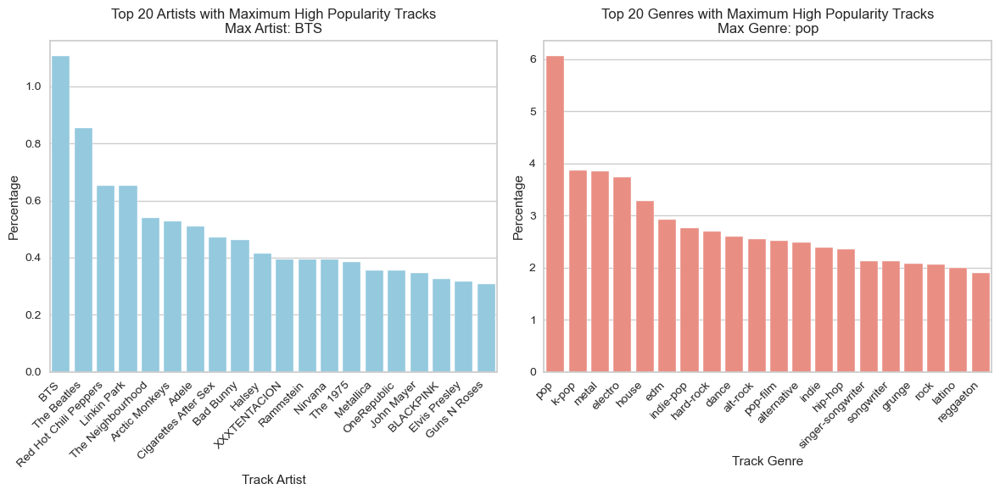

In [35]:
# Filter the DataFrame to include only 'high' popularity class tracks
high_popularity_df = spotify_df[spotify_df['popularity_class'] == 'High']

# Calculate the percentage distribution of 'high' popularity class tracks for each artist and genre
artist_high_popularity_percentage = (high_popularity_df['artists_cleaned'].value_counts() / len(high_popularity_df)) * 100
genre_high_popularity_percentage = (high_popularity_df['track_genre'].value_counts() / len(high_popularity_df)) * 100

# Select only the top 20 artists and genres
top_20_artists = artist_high_popularity_percentage.head(20)
top_20_genres = genre_high_popularity_percentage.head(20)

# Find the artist and genre with the maximum percentage among the top 20
max_artist = top_20_artists.idxmax()
max_genre = top_20_genres.idxmax()

# Plot the results
plt.figure(figsize=(12, 6))

# Plot for top 20 artists
plt.subplot(1, 2, 1)
sns.barplot(x=top_20_artists.index, y=top_20_artists.values, color='skyblue')
plt.title(f'Top 20 Artists with Maximum High Popularity Tracks\nMax Artist: {max_artist}')
plt.xlabel('Track Artist')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

# Plot for top 20 genres
plt.subplot(1, 2, 2)
sns.barplot(x=top_20_genres.index, y=top_20_genres.values, color='salmon')
plt.title(f'Top 20 Genres with Maximum High Popularity Tracks\nMax Genre: {max_genre}')
plt.xlabel('Track Genre')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

plt.tight_layout()
plt.show()

In [127]:
spotify_df.loc[spotify_df['popularity_class'] == 'High',['track_name','popularity']].sort_values(by = 'popularity',ascending = False)

,track_name,popularity
20001,Unholy (feat. Kim Petras),100
81051,Unholy (feat. Kim Petras),100
51664,"Quevedo: Bzrp Music Sessions, Vol. 52",99
20008,I'm Good (Blue),98
89411,La Bachata,98
...,...,...
81998,Vaarayo Vaarayo,64
81996,Annul Maelae,64
81995,Yathe Yathe,64
81994,Adada Adada,64


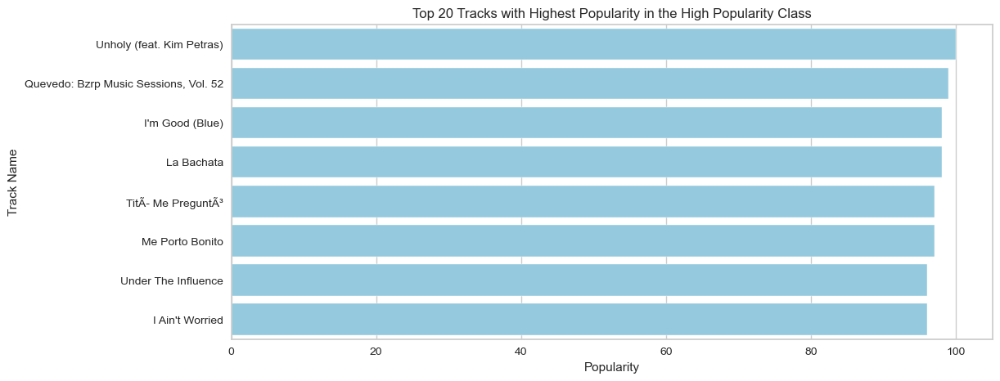

In [129]:
# Filter the DataFrame to include only 'High' popularity class tracks
high_popularity_df = spotify_df[spotify_df['popularity_class'] == 'High']

# Sort the DataFrame by popularity in descending order
high_popularity_df = high_popularity_df.sort_values(by='popularity', ascending=False)

# Select the top 20 tracks with the highest popularity scores
top_20_tracks = high_popularity_df.head(20)

# Plot the results
plt.figure(figsize=(12, 5))

# Horizontal bar chart for top 20 tracks
sns.barplot(x='popularity', y='track_name', data=top_20_tracks, color='skyblue')
plt.title('Top 20 Tracks with Highest Popularity in the High Popularity Class')
plt.xlabel('Popularity')
plt.ylabel('Track Name')

plt.show()

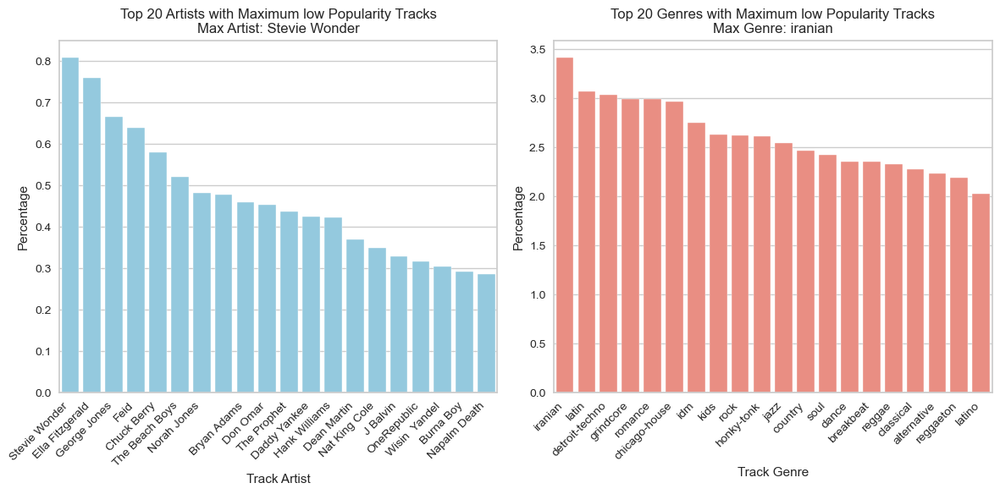

In [36]:
# Filter the DataFrame to include only 'high' popularity class tracks
low_popularity_df = spotify_df[spotify_df['popularity_class'] == 'Low']

# Calculate the percentage distribution of 'high' popularity class tracks for each artist and genre
artist_low_popularity_percentage = (low_popularity_df['artists_cleaned'].value_counts() / len(low_popularity_df)) * 100
genre_low_popularity_percentage = (low_popularity_df['track_genre'].value_counts() / len(low_popularity_df)) * 100

# Select only the top 20 artists and genres
top_20_artists = artist_low_popularity_percentage.head(20)
top_20_genres = genre_low_popularity_percentage.head(20)

# Find the artist and genre with the maximum percentage among the top 20
max_artist = top_20_artists.idxmax()
max_genre = top_20_genres.idxmax()

# Plot the results
plt.figure(figsize=(12, 6))

# Plot for top 20 artists
plt.subplot(1, 2, 1)
sns.barplot(x=top_20_artists.index, y=top_20_artists.values, color='skyblue')
plt.title(f'Top 20 Artists with Maximum low Popularity Tracks\nMax Artist: {max_artist}')
plt.xlabel('Track Artist')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

# Plot for top 20 genres
plt.subplot(1, 2, 2)
sns.barplot(x=top_20_genres.index, y=top_20_genres.values, color='salmon')
plt.title(f'Top 20 Genres with Maximum low Popularity Tracks\nMax Genre: {max_genre}')
plt.xlabel('Track Genre')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

plt.tight_layout()
plt.show()

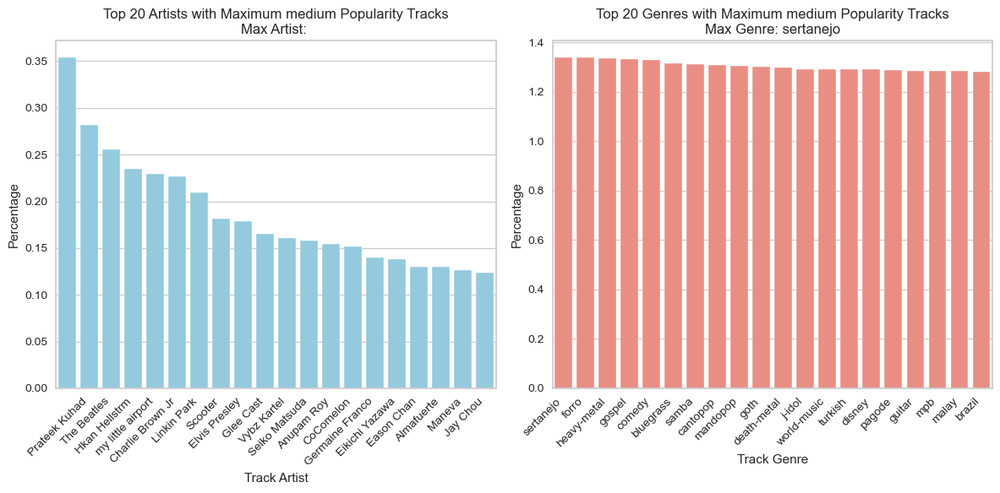

In [37]:
# Filter the DataFrame to include only 'high' popularity class tracks
medium_popularity_df = spotify_df[spotify_df['popularity_class'] == 'Medium']

# Calculate the percentage distribution of 'high' popularity class tracks for each artist and genre
artist_medium_popularity_percentage = (medium_popularity_df['artists_cleaned'].value_counts() / len(medium_popularity_df)) * 100
genre_medium_popularity_percentage = (medium_popularity_df['track_genre'].value_counts() / len(medium_popularity_df)) * 100

# Select only the top 20 artists and genres
top_20_artists = artist_medium_popularity_percentage.head(20)
top_20_genres = genre_medium_popularity_percentage.head(20)

# Find the artist and genre with the maximum percentage among the top 20
max_artist = top_20_artists.idxmax()
max_genre = top_20_genres.idxmax()

# Plot the results
plt.figure(figsize=(12, 6))

# Plot for top 20 artists
plt.subplot(1, 2, 1)
sns.barplot(x=top_20_artists.index, y=top_20_artists.values, color='skyblue')
plt.title(f'Top 20 Artists with Maximum medium Popularity Tracks\nMax Artist: {max_artist}')
plt.xlabel('Track Artist')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

# Plot for top 20 genres
plt.subplot(1, 2, 2)
sns.barplot(x=top_20_genres.index, y=top_20_genres.values, color='salmon')
plt.title(f'Top 20 Genres with Maximum medium Popularity Tracks\nMax Genre: {max_genre}')
plt.xlabel('Track Genre')
plt.ylabel('Percentage')
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better visibility

plt.tight_layout()
plt.show()

In [38]:
spotify_df['artists_cleaned'].value_counts(ascending=False)

                                        285
The Beatles                             279
George Jones                            260
Stevie Wonder                           235
Linkin Park                             224
                                       ... 
Stavros Sounds                            1
DOWN                                      1
Preto no BrancoEli Soares                 1
Preto no BrancoCsar Menotti  Fabiano      1
Jesus Culture                             1
Name: artists_cleaned, Length: 31225, dtype: int64

#### Creating my features dataframe

In [39]:
spotify_df.columns

Index(['track_id', 'artists', 'album_name', 'track_name', 'popularity',
       'duration_ms', 'explicit', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'track_genre', 'popularity_class',
       'artists_cleaned'],
      dtype='object')

In [40]:
spotify_df['explicit'].value_counts()

False    103832
True       9718
Name: explicit, dtype: int64

In [41]:
spotify_df['explicit'] = spotify_df['explicit'].astype(int)

In [42]:
features_df = spotify_df.drop(['track_id', 'artists', 'album_name', 'track_name', 'popularity','artists_cleaned','popularity_class'],axis=1)

In [43]:
features_df.head()

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


In [44]:
features_encoded_df = pd.get_dummies(features_df, columns=['track_genre'], prefix='genre')
# Drop the original 'track_genre' column
# features_encoded_df = features_encoded_df.drop('track_genre', axis=1)

In [45]:
features_encoded_df.head()

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre_acoustic,genre_afrobeat,genre_alt-rock,genre_alternative,genre_ambient,genre_anime,genre_black-metal,genre_bluegrass,genre_blues,genre_brazil,genre_breakbeat,genre_british,genre_cantopop,genre_chicago-house,genre_children,genre_chill,genre_classical,genre_club,genre_comedy,genre_country,genre_dance,genre_dancehall,genre_death-metal,genre_deep-house,genre_detroit-techno,genre_disco,genre_disney,genre_drum-and-bass,genre_dub,genre_dubstep,genre_edm,genre_electro,genre_electronic,genre_emo,genre_folk,genre_forro,genre_french,genre_funk,genre_garage,genre_german,genre_gospel,genre_goth,genre_grindcore,genre_groove,genre_grunge,genre_guitar,genre_happy,genre_hard-rock,genre_hardcore,genre_hardstyle,genre_heavy-metal,genre_hip-hop,genre_honky-tonk,genre_house,genre_idm,genre_indian,genre_indie,genre_indie-pop,genre_industrial,genre_iranian,genre_j-dance,genre_j-idol,genre_j-pop,genre_j-rock,genre_jazz,genre_k-pop,genre_kids,genre_latin,genre_latino,genre_malay,genre_mandopop,genre_metal,genre_metalcore,genre_minimal-techno,genre_mpb,genre_new-age,genre_opera,genre_pagode,genre_party,genre_piano,genre_pop,genre_pop-film,genre_power-pop,genre_progressive-house,genre_psych-rock,genre_punk,genre_punk-rock,genre_r-n-b,genre_reggae,genre_reggaeton,genre_rock,genre_rock-n-roll,genre_rockabilly,genre_romance,genre_sad,genre_salsa,genre_samba,genre_sertanejo,genre_show-tunes,genre_singer-songwriter,genre_ska,genre_sleep,genre_songwriter,genre_soul,genre_spanish,genre_study,genre_swedish,genre_synth-pop,genre_tango,genre_techno,genre_trance,genre_trip-hop,genre_turkish,genre_world-music
0,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


#### Scaling the data for logistic regression

In [46]:
std_scaler = StandardScaler()

In [47]:
features_scaled_encoded_df = pd.DataFrame(std_scaler.fit_transform(features_encoded_df), columns=features_encoded_df.columns)
features_scaled_encoded_df.head()

,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,genre_acoustic,genre_afrobeat,genre_alt-rock,genre_alternative,genre_ambient,genre_anime,genre_black-metal,genre_bluegrass,genre_blues,genre_brazil,genre_breakbeat,genre_british,genre_cantopop,genre_chicago-house,genre_children,genre_chill,genre_classical,genre_club,genre_comedy,genre_country,genre_dance,genre_dancehall,genre_death-metal,genre_deep-house,genre_detroit-techno,genre_disco,genre_disney,genre_drum-and-bass,genre_dub,genre_dubstep,genre_edm,genre_electro,genre_electronic,genre_emo,genre_folk,genre_forro,genre_french,genre_funk,genre_garage,genre_german,genre_gospel,genre_goth,genre_grindcore,genre_groove,genre_grunge,genre_guitar,genre_happy,genre_hard-rock,genre_hardcore,genre_hardstyle,genre_heavy-metal,genre_hip-hop,genre_honky-tonk,genre_house,genre_idm,genre_indian,genre_indie,genre_indie-pop,genre_industrial,genre_iranian,genre_j-dance,genre_j-idol,genre_j-pop,genre_j-rock,genre_jazz,genre_k-pop,genre_kids,genre_latin,genre_latino,genre_malay,genre_mandopop,genre_metal,genre_metalcore,genre_minimal-techno,genre_mpb,genre_new-age,genre_opera,genre_pagode,genre_party,genre_piano,genre_pop,genre_pop-film,genre_power-pop,genre_progressive-house,genre_psych-rock,genre_punk,genre_punk-rock,genre_r-n-b,genre_reggae,genre_reggaeton,genre_rock,genre_rock-n-roll,genre_rockabilly,genre_romance,genre_sad,genre_salsa,genre_samba,genre_sertanejo,genre_show-tunes,genre_singer-songwriter,genre_ska,genre_sleep,genre_songwriter,genre_soul,genre_spanish,genre_study,genre_swedish,genre_synth-pop,genre_tango,genre_techno,genre_trance,genre_trip-hop,genre_turkish,genre_world-music
0,0.024307,-0.305931,0.628399,-0.721329,-1.210484,0.298804,-1.327163,0.551488,-0.849239,-0.503536,0.758102,0.928975,-1.143002,0.221658,10.608958,-0.094212,-0.094212,-0.094212,-0.094212,-0.094212,-0.094117,-0.094165,-0.094165,-0.094165,-0.094212,-0.09426,-0.094212,-0.094165,-0.094165,-0.094212,-0.09102,-0.094022,-0.09407,-0.09426,-0.092581,-0.094212,-0.094212,-0.094165,-0.094165,-0.09426,-0.094212,-0.09407,-0.094212,-0.094212,-0.093927,-0.094165,-0.09426,-0.09426,-0.094212,-0.094165,-0.094212,-0.09426,-0.09426,-0.092485,-0.094212,-0.094212,-0.094165,-0.094165,-0.094212,-0.094212,-0.094212,-0.094165,-0.094212,-0.094165,-0.094165,-0.093831,-0.093352,-0.094212,-0.094165,-0.094212,-0.094117,-0.09426,-0.09426,-0.093688,-0.093927,-0.094212,-0.094165,-0.09426,-0.094212,-0.094212,-0.093831,-0.093783,-0.093927,-0.094212,-0.09426,-0.094165,-0.09426,-0.094165,-0.09426,-0.093974,-0.093879,-0.09426,-0.093974,-0.094165,-0.093927,-0.094212,-0.09407,-0.094212,-0.09407,-0.094212,-0.09426,-0.09426,-0.09426,-0.09426,-0.09426,-0.09426,-0.094212,-0.089583,-0.09426,-0.094165,-0.09426,-0.09426,-0.094212,-0.09426,-0.09426,-0.09426,-0.09426,-0.094212,-0.09426,-0.094165,-0.09426,-0.09426,-0.09426,-0.09426,-0.094212,-0.094117,-0.094212,-0.094212
1,-0.737395,-0.305931,-0.847890,-1.896388,-1.210484,-1.794233,0.753487,-0.079180,1.837672,-0.503521,-0.591259,-0.799404,-1.490918,0.221658,10.608958,-0.094212,-0.094212,-0.094212,-0.094212,-0.094212,-0.094117,-0.094165,-0.094165,-0.094165,-0.094212,-0.09426,-0.094212,-0.094165,-0.094165,-0.094212,-0.09102,-0.094022,-0.09407,-0.09426,-0.092581,-0.094212,-0.094212,-0.094165,-0.094165,-0.09426,-0.094212,-0.09407,-0.094212,-0.094212,-0.093927,-0.094165,-0.09426,-0.09426,-0.094212,-0.094165,-0.094212,-0.09426,-0.09426,-0.092485,-0.094212,-0.094212,-0.094165,-0.094165,-0.094212,-0.094212,-0.094212,-0.094165,-0.094212,-0.094165,-0.094165,-0.093831,-0.093352,-0.094212,-0.094165,-0.094212,-0.094117,-0.09426,-0.09426,-0.093688,-0.093927,-0.094212,-0.094165,-0.09426,-0.094212,-0.094212,-0.093831,-0.093783,-0.093927,-0.094212,-0.09426,-0.094165,-0.09426,-0.094165,-0.09426,-0.093974,-0.093879,-0.09426,-0.093974,-0.094165,-0.093927,-0.094212,-0.09407,-0.094212,-0.09407,-0.094212,-0.09426,-0.09426,-0.09426,-0.09426,-0

In [50]:
X_train_sc, X_test_sc, y_train_sc, y_test_sc = train_test_split(features_scaled_encoded_df, spotify_df['popularity_class'].values, test_size=0.3, random_state=123)

In [130]:
y_train_numeric = label_encoder.transform(y_train_sc)
y_test_numeric = label_encoder.transform(y_test_sc)

In [131]:
# Create the SMOTE object
smote = SMOTE(random_state=123)

# Use fit_resample to both fit the method and oversample the data
X_train_sc_resampled, y_train_sc_resampled = smote.fit_resample(X_train_sc, y_train_numeric)

In [144]:
y_train_sc_resampled

array([2, 1, 2, ..., 1, 1, 1])

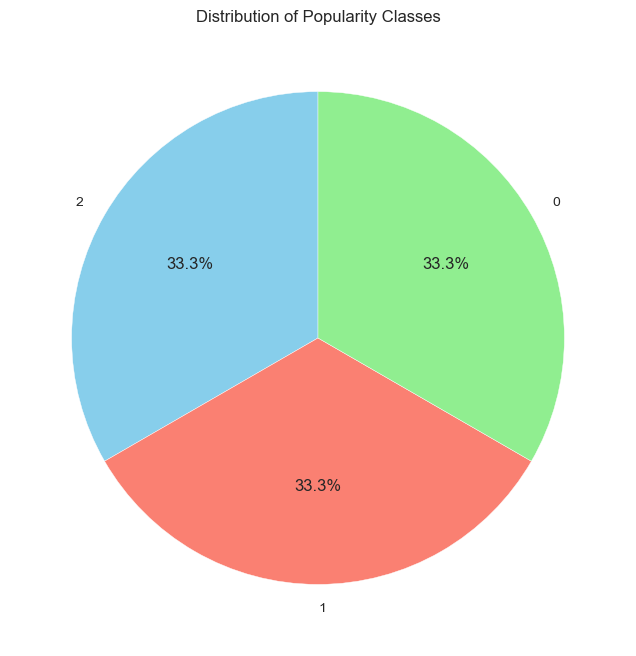

In [133]:
# Assuming 'y_train_resampled' is a NumPy array
popularity_series = pd.Series(y_train_sc_resampled)

# Assuming 'popularity_class' is the column name or the category you're interested in
popularity_counts = popularity_series.value_counts(normalize=True)

# Create a pie chart
plt.figure(figsize=(8, 8))
popularity_counts.plot.pie(autopct='%1.1f%%', startangle=90, colors=['skyblue', 'salmon', 'lightgreen'])
plt.title('Distribution of Popularity Classes')
plt.ylabel('')  # Remove the default 'count' label on the y-axis
plt.show()

In [145]:
#logistic regression model
lr = LogisticRegression()

#hyperparameter
lr_params = {'penalty': ['l1', 'l2'], 'solver': ['lbfgs', 'liblinear'], 'C': [1e-2, 0.1, 1]}

#gridsearch for hyperparameter tuning
#StratifiedKFold for model cross-validation (to handle overfitting)
grid_model_lr = GridSearchCV(estimator=lr, param_grid=lr_params, cv=StratifiedKFold(), verbose=4, n_jobs=2)

#fitting the model
grid_model_lr.fit(X_train_sc_resampled, y_train_sc_resampled)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=LogisticRegression(), n_jobs=2,
             param_grid={'C': [0.01, 0.1, 1], 'penalty': ['l1', 'l2'],
                         'solver': ['lbfgs', 'liblinear']},
             verbose=4)

In [136]:
# # load the model from disk
# filename = "E:/Data Science Masters/Learning From Data/archive_spotif_new/lr_model_sc_resampled_best.sav"
# grid_model_lr = pickle.load(open(filename, 'rb'))

In [156]:
# best logistic regression parameters
grid_model_lr.best_params_

{'C': 0.01, 'penalty': 'l2', 'solver': 'lbfgs'}

In [147]:
import pickle
# save the model to disk
filename = 'lr_model_sc_resampled_best.sav'
pickle.dump(grid_model_lr, open(filename, 'wb'))

In [157]:
# test predictions
y_pred_lr = grid_model_lr.predict(X_test_sc)
# test probabilities
y_pred_prob_lr = grid_model_lr.predict_proba(X_test_sc)

In [158]:
# Assuming you have a DataFrame or Series with classes ('High', 'Low', 'Medium')
class_order = [0,1,2]

# Ensure the order of classes in y_pred_prob matches class_order
y_pred_prob_lr_ordered = y_pred_prob_lr[:, [class_order.index(cls) for cls in class_order]]

In [58]:
label_encoder = LabelEncoder()
y_test_numeric = label_encoder.fit_transform(y_test_sc)
y_pred_numeric = label_encoder.transform(y_pred_lr)
y_train_numeric = label_encoder.transform(y_train_sc)

In [59]:
original_labels = label_encoder.classes_

In [60]:
original_labels

array(['High', 'Low', 'Medium'], dtype=object)

In [94]:
#Function for Model Summary
def show_model_summary(y_true, y_pred, y_pred_prob):

        print('Classification Report: ')
        print(classification_report(y_true, y_pred))
        print('Confusion Matrix: ')
        print(confusion_matrix(y_true, y_pred))
        print('Logloss: ', log_loss(y_true, y_pred_prob))
        print('R-Squared' , r2_score(y_true,y_pred))
             
        auc_score = roc_auc_score(y_true, y_pred_prob,multi_class='ovo')
        print('auc: ', auc_score)

In [160]:
show_model_summary(y_test_numeric, y_pred_lr, y_pred_prob_lr_ordered)

Classification Report: 
              precision    recall  f1-score   support

           0       0.25      0.69      0.37      3158
           1       0.65      0.56      0.61      8573
           2       0.89      0.71      0.79     22334

    accuracy                           0.67     34065
   macro avg       0.60      0.66      0.59     34065
weighted avg       0.77      0.67      0.71     34065

Confusion Matrix: 
[[ 2180   438   540]
 [ 2317  4840  1416]
 [ 4231  2143 15960]]
Logloss:  0.7166003369747166
R-Squared -0.7280639450007478
auc:  0.8398059108683258


In [140]:
#Function for Plotting AUC-ROC curve
def plot_roc_auc(trained_model, X_test, y_test):
    # roc-auc curve
    plt.figure(figsize=(10, 8))
    visualizer = ROCAUC(trained_model, classes=['High', 'Low', 'Medium'])
    visualizer.score(X_test, y_test)    
    visualizer.show()
    plt.show()

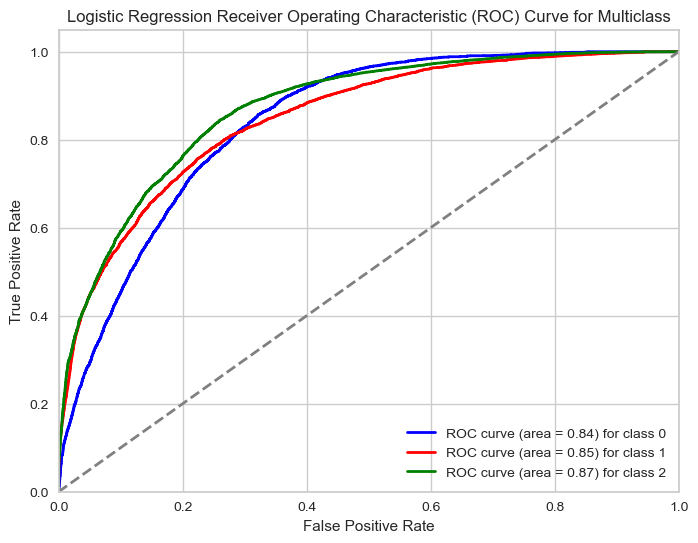

In [161]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming grid_model_lr is your Logistic Regression model
y_score = grid_model_lr.best_estimator_.predict_proba(X_test_sc)


# Binarize the labels
y_test_bin = label_binarize(y_test_numeric, classes=[0, 1, 2])

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming you have 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Logistic Regression Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()

In [65]:
y_test_bin

array([[0, 0, 1],
       [0, 1, 0],
       [0, 0, 1],
       ...,
       [1, 0, 0],
       [0, 0, 1],
       [0, 0, 1]])

In [66]:
#Function for getting feature importances
def get_importance(features, importances):
    feature_importance_df = pd.DataFrame({'features': features, 'importances': importances})

    plt.figure(figsize=(25,5))
    plt.bar(features, importances)
    plt.tight_layout()
    plt.xticks(rotation=90)
    plt.show()
    
    return feature_importance_df

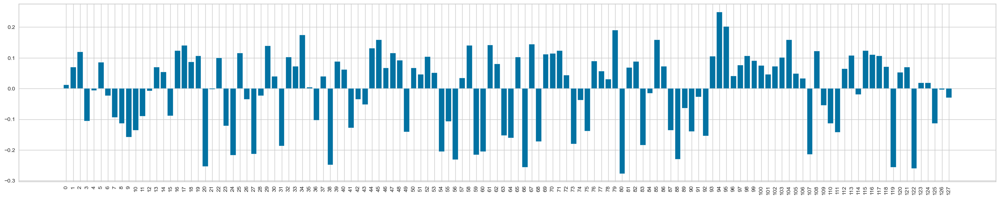

,features,importances
0,0,0.012021
1,1,0.069623
2,2,0.119484
3,3,-0.105213
4,4,-0.006798
...,...,...
123,123,0.018832
124,124,0.018669
125,125,-0.113417
126,126,-0.003552


In [67]:
# logistic regression feature importance
get_importance([str(x) for x in list(range(X_train_sc.shape[1]))], grid_model_lr.best_estimator_.coef_[0])

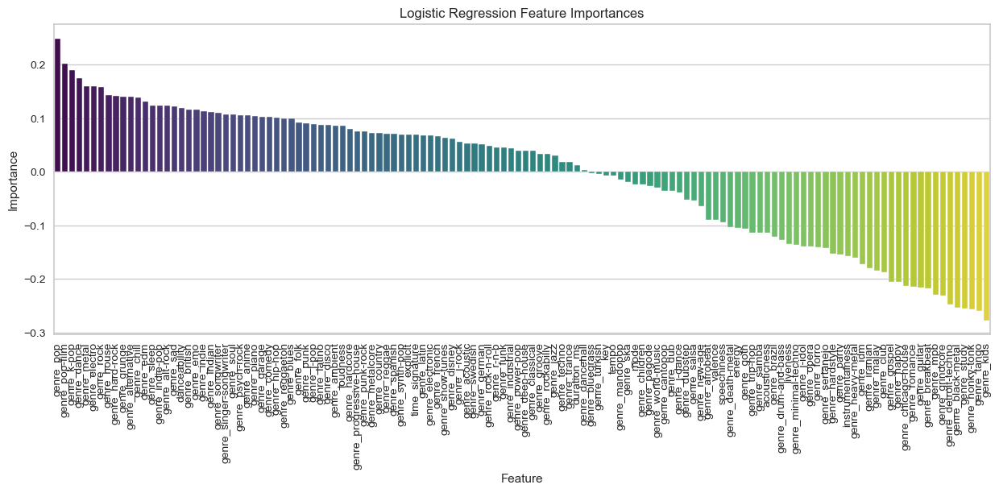

In [68]:
# Assuming grid_model_lr is your Logistic Regression model

# Get feature importances
importances = grid_model_lr.best_estimator_.coef_[0]

# Get feature names
feature_names = X_train_sc.columns

# Create a DataFrame with feature names and importances
feature_importance_df = pd.DataFrame({'features': feature_names, 'importances': importances})

# Sort the DataFrame by importances in descending order
feature_importance_df = feature_importance_df.sort_values(by='importances', ascending=False)

# Plot the feature importances
plt.figure(figsize=(15, 5))
sns.barplot(x='features', y='importances', data=feature_importance_df, palette='viridis')
plt.title('Logistic Regression Feature Importances')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.xticks(rotation=90)
plt.show()

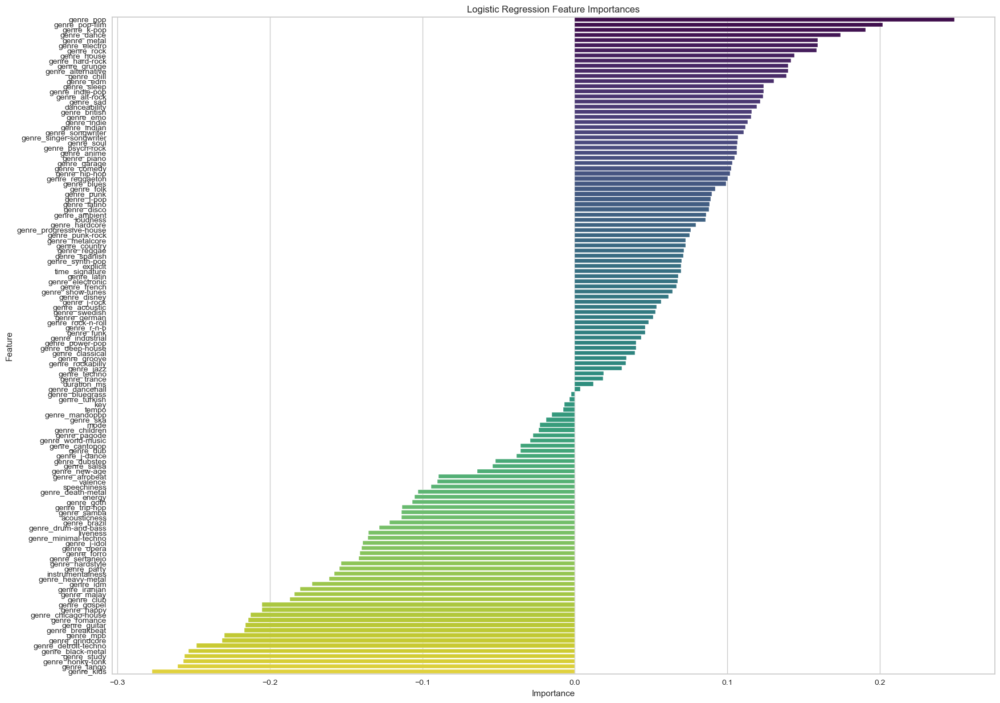

In [69]:
# Assuming grid_model_lr is your Logistic Regression model

# Get feature importances
importances = grid_model_lr.best_estimator_.coef_[0]

# Get feature names
feature_names = X_train_sc.columns

# Create a DataFrame with feature names and importances
feature_importance_df = pd.DataFrame({'features': feature_names, 'importances': importances})

# Sort the DataFrame by importances in descending order
feature_importance_df = feature_importance_df.sort_values(by='importances', ascending=False)

# Plot the horizontal bar plot for feature importances
plt.figure(figsize=(20, 15))
sns.barplot(x='importances', y='features', data=feature_importance_df, palette='viridis')
plt.title('Logistic Regression Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

#### Running Ensemble models with Original data

In [100]:
X_train, X_test, y_train, y_test = train_test_split(features_encoded_df, spotify_df['popularity_class'].values, 
                                                    test_size=0.3, random_state=123)

In [101]:
label_encoder = LabelEncoder()
y_test_numeric = label_encoder.fit_transform(y_test)
y_train_numeric = label_encoder.transform(y_train)

In [102]:
original_labels = label_encoder.classes_
original_labels

array(['High', 'Low', 'Medium'], dtype=object)

In [86]:
# initializing ensemble models
rf_model = RandomForestClassifier(random_state = 123)
gboost_model = GradientBoostingClassifier(random_state = 123)
xgboost_model = XGBClassifier(random_state = 123)

In [87]:
# Assuming y_train has values 0 (Medium), 1 (Low), and 2 (High)
num_high_class = np.sum(y_train_numeric == 0)
num_other_classes = len(y_train_numeric) - num_high_class

scale_pos_weight = num_other_classes / num_high_class
print("Calculated scale_pos_weight:", scale_pos_weight)

Calculated scale_pos_weight: 9.979636763896533


In [88]:
# individual model hyperparameters
rf_params = {'n_estimators':[100, 200,300], 'max_depth':[2,3,4], 'min_samples_split':[4, 6,10], 'min_samples_leaf':[2,3,4]}
gbm_params = {'n_estimators':[100,200], 'learning_rate':[1e-2, 0.1, 1.0], 'max_depth':[2,3,4], 'min_samples_split':[2, 4, 6]}
xgb_params = {'n_estimators':[200,300],'learning_rate':[1e-2, 0.1, 1.0], 'max_depth':[4,6,10], 
              'reg_alpha': [1e-2, 0.1], 'reg_lambda': [1e-2, 0.1],"gamma" :[0,10,30]}

In [89]:
# storing model object and hyperparameters in a dictionary
model_dict = {'random_forest': [rf_model, rf_params], 
              'gradient_boost': [gboost_model, gbm_params], 
              'xgboost': [xgboost_model, xgb_params]}

In [91]:
# list to store best model and results
trained_models = []
# train each ensemble model one by one
# tqdm to show progress
for model_name in tqdm(model_dict):
    print('Training %s model ' %model_name)
    model_entity = model_dict[model_name]
    estimator = model_entity[0]
    estimator_params = model_entity[1]
    # Grid search for hyperparameter tuning
    # Randomized search for faster hyperparameter tuning (Use n_iter=10 or any number to limit in case of randomized search, use n_jobs=-1 to use all cores, use k in KFold() if needed)
    # StratiedfiedKFold for model cross-validation
    estimator_grid_model = GridSearchCV(estimator=estimator, param_grid=estimator_params, cv=StratifiedKFold(), n_jobs=-1, verbose=4)
    #estimator_grid_model = RandomizedSearchCV(estimator=estimator, param_distributions=estimator_params, cv=StratifiedKFold(), n_jobs=1, n_iter=10)
    estimator_grid_model.fit(X_train, y_train_numeric)
    print('\n %s Model training complete.' %model_name)
    # get test results
    y_pred_grid_model = estimator_grid_model.predict(X_test)
    # get test probabilities
    y_pred_prob_grid_model = estimator_grid_model.predict_proba(X_test)
    # store model name with best estimator and results in a dict object
    trained_model_dict = {}
    trained_model_dict['model_name'] = model_name
    trained_model_dict['best_estimator'] = estimator_grid_model.best_estimator_
    trained_model_dict['y_pred'] = y_pred_grid_model
    trained_model_dict['y_pred_prob'] = y_pred_prob_grid_model
    # append to results to list
    trained_models.append(trained_model_dict)
# trained_models

  0%|                                                                                            | 0/3 [00:00<?, ?it/s]

Training random_forest model 
Fitting 5 folds for each of 81 candidates, totalling 405 fits

 random_forest Model training complete.


 33%|███████████████████████████▋                                                       | 1/3 [05:15<10:30, 315.05s/it]

Training gradient_boost model 
Fitting 5 folds for each of 54 candidates, totalling 270 fits

 gradient_boost Model training complete.


 67%|█████████████████████████████████████████████████████▎                          | 2/3 [1:12:32<41:44, 2504.46s/it]

Training xgboost model 
Fitting 5 folds for each of 216 candidates, totalling 1080 fits
[23:44:39] WARNING: D:\bld\xgboost-split_1700182179651\work\src\learner.cc:767: 
Parameters: { "scale_pos_weight" } are not used.


 xgboost Model training complete.


100%|████████████████████████████████████████████████████████████████████████████████| 3/3 [6:57:43<00:00, 8354.39s/it]


In [92]:
print(X_test.shape)

(34200, 128)


In [93]:
rf_model_og_best = trained_models[0]['best_estimator']
y_pred_og_rf = trained_models[0]['y_pred']
y_prob_og_rf = trained_models[0]['y_pred_prob']

In [94]:
import pickle
# save the model to disk
filename = 'rf_model_og_best.sav'
pickle.dump(rf_model_og_best, open(filename, 'wb'))

In [95]:
gb_model_og_best = trained_models[1]['best_estimator']
y_pred_og_gb = trained_models[1]['y_pred']
y_prob_og_gb = trained_models[1]['y_pred_prob']

In [96]:
import pickle
# save the model to disk
filename = 'gb_model_og_best.sav'
pickle.dump(gb_model_og_best, open(filename, 'wb'))

In [97]:
xgb_model_og_best = trained_models[2]['best_estimator']
y_pred_og_xgb = trained_models[2]['y_pred']
y_prob_og_xgb = trained_models[2]['y_pred_prob']

In [67]:
print(xgb_model_og_best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)


In [98]:
#New
print(xgb_model_og_best)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=0, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=1.0, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=10, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=300, n_jobs=None, num_parallel_tree=None,
              objective='multi:softprob', predictor=None, ...)


In [99]:
import pickle
# save the model to disk
filename = 'xgb_model_og_best.sav'
pickle.dump(xgb_model_og_best, open(filename, 'wb'))

In [100]:
def test_eval(clf_model,y_pred,y_prob ,y_test, algo=None, sampling=None):
    # Test set prediction
#     y_prob=clf_model.predict_proba(X_test)
#     y_pred=clf_model.predict(X_test)

    print('Confusion Matrix')
    print('='*60)
    print(confusion_matrix(y_test,y_pred),"\n")
    print('Classification Report')
    print('='*60)
    print(classification_report(y_test,y_pred),"\n")
    print('AUC-ROC')
    print('='*60)
    print(roc_auc_score(y_test, y_prob[:,1]))
    score = f1_score(y_test, y_pred, average = 'weighted')
    # Printing evaluation metric (f1-score) 
    print("f1 score: {}".format(score))
          
    model_cv.append(algo)
    precision_cv.append(precision_score(y_test,y_pred))
    recall_cv.append(recall_score(y_test,y_pred))
    F1score_cv.append(score)
    AUCROC_cv.append(roc_auc_score(y_test, y_prob[:,1]))
    resample_cv.append(sampling)
    precision_neg_cv.append(get_precision_negative_class(y_test,y_pred))
    recall_neg_cv.append(get_recall_negative_class(y_test,y_pred))

In [101]:
# showing model results one by one
for model_dict in trained_models:
    
    # get model data
    model_name = model_dict['model_name']
    estimator = model_dict['best_estimator']
    y_pred = model_dict['y_pred']
    y_pred_prob = model_dict['y_pred_prob']
    
    print('=====================================================')
    print('\n')
    # show model summary
    print('Showing summary for %s model' %model_name)
    show_model_summary(y_test_numeric, y_pred, y_pred_prob)
    
    # plot roc-auc curve
    # print('ROC-AUC curve for %s model' %model_name)
    # plot_roc_auc(estimator, X_test, y_test_numeric)
    
    # # plot feature importance
    # print('Feature Importance for %s model' %model_name)
    # features = ['component_'+str(x) for x in list(range(X_train_pca.shape[1]))]
    # get_importance(features, estimator.feature_importances_)
    
    print('\n')



Showing summary for random_forest model
Classification Report: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3139
           1       0.95      0.03      0.06      8626
           2       0.66      1.00      0.80     22435

    accuracy                           0.66     34200
   macro avg       0.54      0.34      0.29     34200
weighted avg       0.67      0.66      0.54     34200

Confusion Matrix: 
[[    0     0  3139]
 [    0   287  8339]
 [    0    14 22421]]
Logloss:  0.7889367105159922
R-Squared -0.423640565902778
auc:  0.7510569100757422




Showing summary for gradient_boost model
Classification Report: 
              precision    recall  f1-score   support

           0       0.46      0.22      0.30      3139
           1       0.72      0.66      0.69      8626
           2       0.83      0.92      0.88     22435

    accuracy                           0.79     34200
   macro avg       0.67      0.60      0.62   

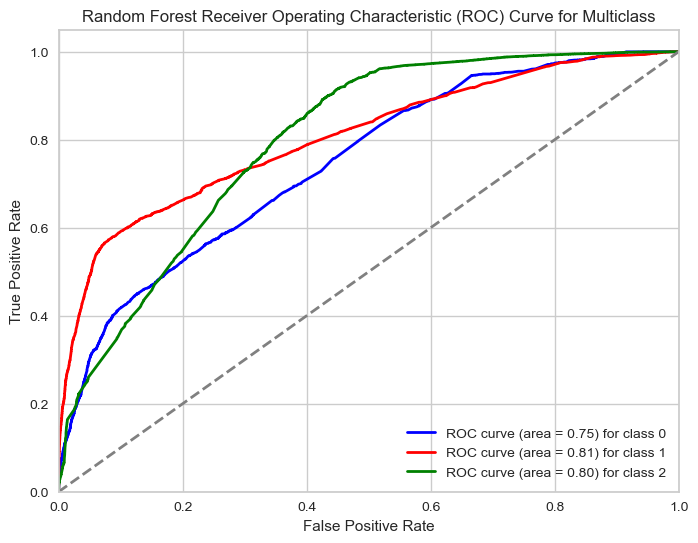

In [181]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming grid_model_lr is your Logistic Regression model
y_score = trained_models[0]['best_estimator'].predict_proba(X_test)

# Binarize the labels
y_test_bin = label_binarize(y_test_numeric, classes=[0, 1, 2])  # Use numeric labels

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming you have 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Random Forest Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()

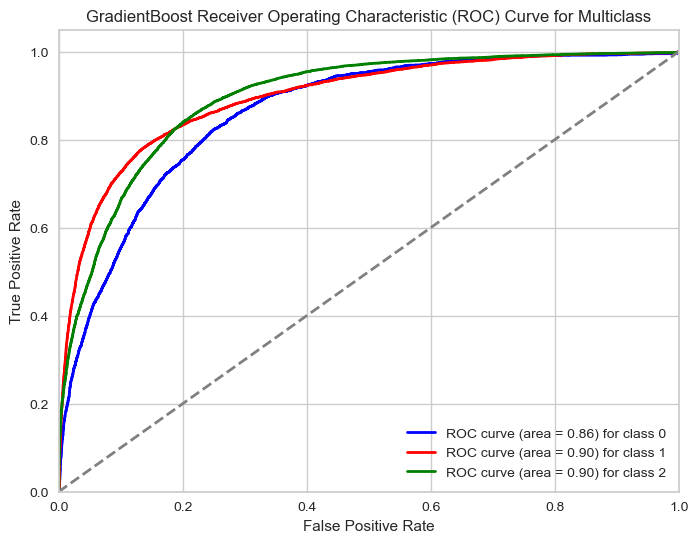

In [188]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming grid_model_lr is your Logistic Regression model
y_score = trained_models[1]['best_estimator'].predict_proba(X_test)

# Binarize the labels
y_test_bin = label_binarize(y_test_numeric, classes=[0, 1, 2])  # Use numeric labels

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming you have 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('GradientBoost Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()

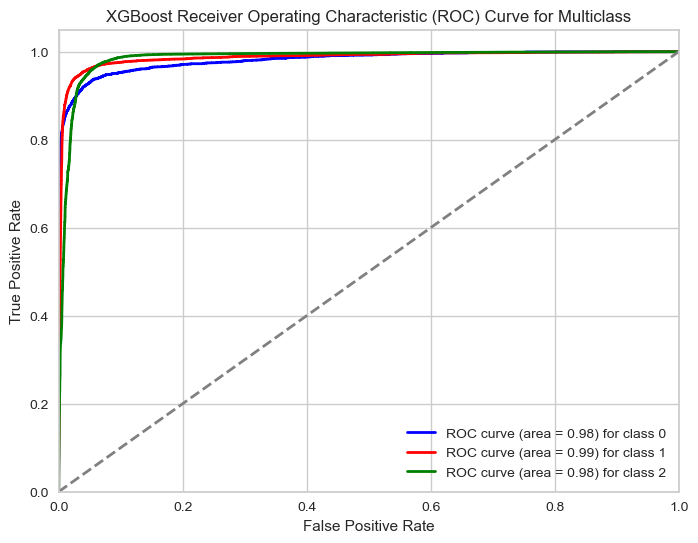

In [189]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming grid_model_lr is your Logistic Regression model
y_score = trained_models[2]['best_estimator'].predict_proba(X_test)

# Binarize the labels
y_test_bin = label_binarize(y_test_numeric, classes=[0, 1, 2])  # Use numeric labels

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming you have 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()

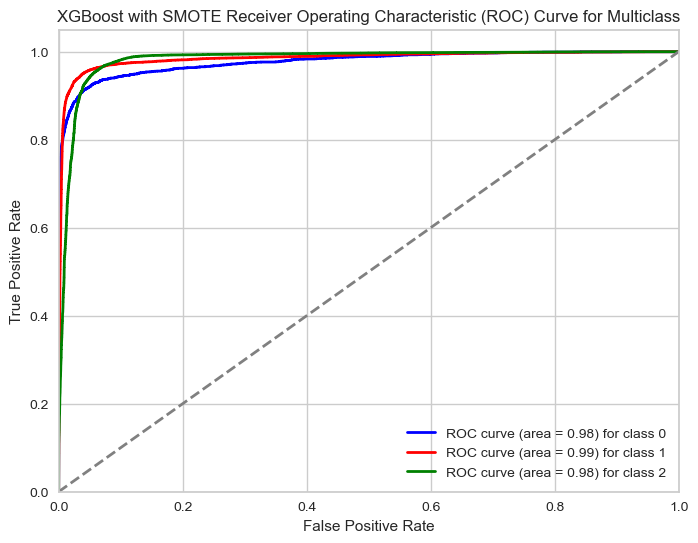

In [190]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Assuming grid_model_lr is your Logistic Regression model
y_score = trained_models[3]['best_estimator'].predict_proba(X_test)

# Binarize the labels
y_test_bin = label_binarize(y_test_numeric, classes=[0, 1, 2])  # Use numeric labels

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(3):  # Assuming you have 3 classes
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(8, 6))
colors = ['blue', 'red', 'green']
for i, color in zip(range(3), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=2,
             label=f'ROC curve (area = {roc_auc[i]:.2f}) for class {i}')

plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('XGBoost with SMOTE Receiver Operating Characteristic (ROC) Curve for Multiclass')
plt.legend(loc="lower right")
plt.show()

#### Creating Xgboost model with SMOTE

In [105]:
# Create the SMOTE object
smote = SMOTE(random_state=123)

# Use fit_resample to both fit the method and oversample the data
X_train_resampled, y_train_resampled_num = smote.fit_resample(X_train, y_train_numeric)

In [106]:
xgboost_model = XGBClassifier(random_state = 123)
xgb_params = {'n_estimators':[200,300],'learning_rate':[0.1, 1.0], 'max_depth':[6,10], 'reg_alpha': [1e-2, 0.1], 'reg_lambda': [1e-2, 0.1],"gamma" :[0,10]}
# storing model object and hyperparameters in a dictionary
model_dict = {'xgboost': [xgboost_model, xgb_params]}

In [107]:
# list to store best model and results
trained_models = []
# train each ensemble model one by one
# tqdm to show progress
for model_name in tqdm(model_dict):
    print('Training %s model ' %model_name)
    model_entity = model_dict[model_name]
    estimator = model_entity[0]
    estimator_params = model_entity[1]
    # Grid search for hyperparameter tuning
    # Randomized search for faster hyperparameter tuning (Use n_iter=10 or any number to limit in case of randomized search, use n_jobs=-1 to use all cores, use k in KFold() if needed)
    # StratiedfiedKFold for model cross-validation
    estimator_grid_model = GridSearchCV(estimator=estimator, param_grid=estimator_params, cv=StratifiedKFold(), n_jobs=-1, verbose=4)
    #estimator_grid_model = RandomizedSearchCV(estimator=estimator, param_distributions=estimator_params, cv=StratifiedKFold(), n_jobs=1, n_iter=10)
    estimator_grid_model.fit(X_train_resampled, y_train_resampled_num)
    print('\n %s Model training complete.' %model_name)
    # get test results
    y_pred_grid_model = estimator_grid_model.predict(X_test)
    # get test probabilities
    y_pred_prob_grid_model = estimator_grid_model.predict_proba(X_test)
    # store model name with best estimator and results in a dict object
    trained_model_dict = {}
    trained_model_dict['model_name'] = model_name
    trained_model_dict['best_estimator'] = estimator_grid_model.best_estimator_
    trained_model_dict['y_pred'] = y_pred_grid_model
    trained_model_dict['y_pred_prob'] = y_pred_prob_grid_model
    # append to results to list
    trained_models.append(trained_model_dict)
# trained_models

  0%|                                                                                                                                | 0/1 [00:00<?, ?it/s]

Training xgboost model 
Fitting 5 folds for each of 64 candidates, totalling 320 fits

 xgboost Model training complete.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1/1 [6:15:45<00:00, 22545.15s/it]


In [108]:
xgb_model_smote_best = trained_models[0]['best_estimator']
y_pred_smote_xgb = trained_models[0]['y_pred']
y_prob_smote_xgb = trained_models[0]['y_pred_prob']

In [109]:
import pickle
# save the model to disk
filename = 'xgb_model_smote_best.sav'
pickle.dump(xgb_model_smote_best, open(filename, 'wb'))

In [91]:
# load the model from disk
filename = "E:/Data Science Masters/Learning From Data/archive_spotif_new/xgb_model_og_best.sav"
xgb_model_og_best = pickle.load(open(filename, 'rb'))

In [110]:
# showing model results one by one
for model_dict in trained_models:
    
    # get model data
    model_name = model_dict['model_name']
    estimator = model_dict['best_estimator']
    y_pred = model_dict['y_pred']
    y_pred_prob = model_dict['y_pred_prob']
    
    print('=====================================================')
    print('\n')
    # show model summary
    print('Showing summary for %s model' %model_name)
    show_model_summary(y_test_numeric, y_pred, y_pred_prob)
    
    # plot roc-auc curve
    # print('ROC-AUC curve for %s model' %model_name)
    # plot_roc_auc(estimator, X_test, y_test_numeric)
    
    # # plot feature importance
    # print('Feature Importance for %s model' %model_name)
    # features = ['component_'+str(x) for x in list(range(X_train_pca.shape[1]))]
    # get_importance(features, estimator.feature_importances_)
    
    print('\n')



Showing summary for xgboost model
Classification Report: 
              precision    recall  f1-score   support

           0       0.65      0.50      0.57      3139
           1       0.80      0.78      0.79      8626
           2       0.88      0.92      0.90     22435

    accuracy                           0.84     34200
   macro avg       0.78      0.73      0.75     34200
weighted avg       0.84      0.84      0.84     34200

Confusion Matrix: 
[[ 1560   419  1160]
 [  209  6761  1656]
 [  613  1284 20538]]
Logloss:  0.5909446025092501
R-Squared 0.27418774534776347
auc:  0.9120008612454124




In [48]:
X_train, X_test, y_train, y_test = train_test_split(features_encoded_df, spotify_df['popularity_class'].values, test_size=0.3, random_state=123)

In [93]:
# get test results
y_pred = xgb_model_og_best.predict(X_test)
# get test probabilities
y_pred_prob = xgb_model_og_best.predict_proba(X_test)

In [94]:
show_model_summary(y_test_numeric, y_pred, y_pred_prob)

Classification Report: 
              precision    recall  f1-score   support

           0       0.76      0.51      0.61      1619
           1       0.82      0.79      0.81      8626
           2       0.91      0.94      0.93     23955

    accuracy                           0.88     34200
   macro avg       0.83      0.75      0.78     34200
weighted avg       0.88      0.88      0.88     34200

Confusion Matrix: 
[[  823   278   518]
 [   92  6828  1706]
 [  170  1184 22601]]
Logloss:  0.4749927808712901
R-Squared 0.45277655859344534
auc:  0.9238248418231322


In [168]:
# List to store best model and results
trained_models = []

# Model names and filenames
model_info = [
    ('random_forest', 'rf_model_og_best.sav'),
    ('gradient_boost', 'gb_model_og_best.sav'),
    ('xgboost', 'xgb_model_og_best.sav'),
    ('xgboost_smote', 'xgb_model_smote_best.sav'),
    ('lr_model_smote_base', 'lr_model_sc_resampled_best.sav')
]

# Load each trained model
for model_name, filename in model_info:
    print(f'Loading {model_name} model ')
    with open(filename, 'rb') as file:
        loaded_model = pickle.load(file)

    # Assuming you have the corresponding X_test and y_test_numeric
    y_pred = loaded_model.predict(X_test)
    y_pred_prob = loaded_model.predict_proba(X_test)

    # Print or store metrics as needed
    print(f'{model_name} Model Metrics:')
    print('Accuracy:', accuracy_score(y_test_numeric, y_pred))
    print('Classification Report:')
    print(classification_report(y_test_numeric, y_pred))
    print('Confusion Matrix:')
    print(confusion_matrix(y_test_numeric, y_pred))

    # You can create a dummy dictionary similar to the one used for training
    trained_model_dict = {
        'model_name': model_name,
        'best_estimator': loaded_model,
        'y_pred': y_pred,
        'y_pred_prob': y_pred_prob
    }

    # Append the loaded model to the list
    trained_models.append(trained_model_dict)

print('All models loaded successfully.')

Loading random_forest model 
random_forest Model Metrics:
Accuracy: 0.6634081902245706
Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3158
           1       0.97      0.03      0.06      8573
           2       0.66      1.00      0.80     22334

    accuracy                           0.66     34065
   macro avg       0.54      0.34      0.29     34065
weighted avg       0.68      0.66      0.54     34065

Confusion Matrix:
[[    0     0  3158]
 [    0   274  8299]
 [    0     9 22325]]
Loading gradient_boost model 
gradient_boost Model Metrics:
Accuracy: 0.8062233964479671
Classification Report:
              precision    recall  f1-score   support

           0       0.55      0.26      0.35      3158
           1       0.74      0.68      0.71      8573
           2       0.84      0.93      0.88     22334

    accuracy                           0.81     34065
   macro avg       0.71      0.62      0.65

In [170]:
trained_models[4]['model_name'] = loaded_model.predict(X_test_sc)
trained_models[4]['y_pred'] = loaded_model.predict(X_test_sc)
trained_models[4]['y_pred_prob'] = loaded_model.predict_proba(X_test_sc)

In [171]:
# showing model results one by one
for model_dict in trained_models:
    
    # get model data
    model_name = model_dict['model_name']
    estimator = model_dict['best_estimator']
    y_pred = model_dict['y_pred']
    y_pred_prob = model_dict['y_pred_prob']
    
    print('=====================================================')
    print('\n')
    # show model summary
    print('Showing summary for %s model' %model_name)
    show_model_summary(y_test_numeric, y_pred, y_pred_prob)
    
    # plot roc-auc curve
    # print('ROC-AUC curve for %s model' %model_name)
    # plot_roc_auc(estimator, X_test, y_test_numeric)
    
    # # plot feature importance
    # print('Feature Importance for %s model' %model_name)
    # features = ['component_'+str(x) for x in list(range(X_train_pca.shape[1]))]
    # get_importance(features, estimator.feature_importances_)
    
    print('\n')



Showing summary for random_forest model
Classification Report: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      3158
           1       0.97      0.03      0.06      8573
           2       0.66      1.00      0.80     22334

    accuracy                           0.66     34065
   macro avg       0.54      0.34      0.29     34065
weighted avg       0.68      0.66      0.54     34065

Confusion Matrix: 
[[    0     0  3158]
 [    0   274  8299]
 [    0     9 22325]]
Logloss:  0.7896336092437678
R-Squared -0.4247444290225868
auc:  0.7540658665953025




Showing summary for gradient_boost model
Classification Report: 
              precision    recall  f1-score   support

           0       0.55      0.26      0.35      3158
           1       0.74      0.68      0.71      8573
           2       0.84      0.93      0.88     22334

    accuracy                           0.81     34065
   macro avg       0.71      0.62      0.65  

In [202]:
# Get all hyperparameters
all_hyperparameters = trained_models[3]['best_estimator'].get_params()

# Define a list of hyperparameters you consider important
important_hyperparameters = ['n_estimators', 'learning_rate', 'max_depth', 'reg_alpha','reg_lambda','gamma']

# Print only the important hyperparameters
print(", ".join([f"{param}: {all_hyperparameters[param]}" for param in important_hyperparameters]))

n_estimators: 300, learning_rate: 1.0, max_depth: 10, reg_alpha: 0.1, reg_lambda: 0.1, gamma: 0


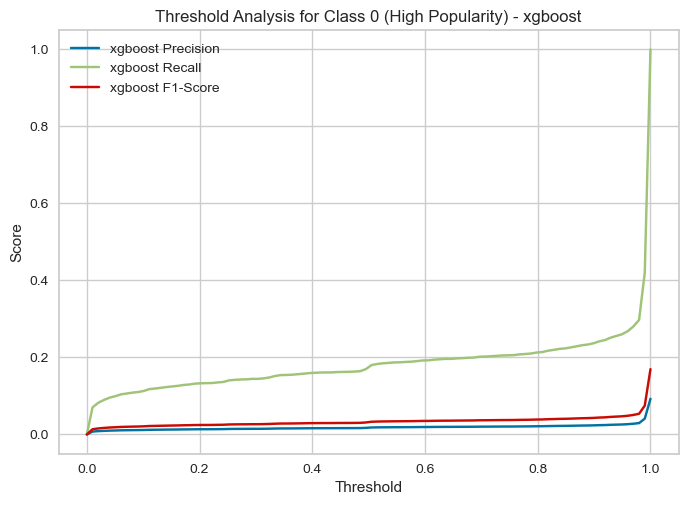

In [99]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score

# Select the XGBoost model
xgb_model_dict = next((model_dict for model_dict in trained_models if model_dict['model_name'] == 'xgboost'), None)

if xgb_model_dict:
    model_name = xgb_model_dict['model_name']
    y_pred_prob = xgb_model_dict['y_pred_prob']

    thresholds = np.linspace(0, 1, 100)
    precision_values, recall_values, f1_values = [], [], []

    for threshold in thresholds:
        y_pred = (y_pred_prob[:, 0] > threshold).astype(int)
        precision = precision_score(y_test_numeric == 0, y_pred == 0)
        recall = recall_score(y_test_numeric == 0, y_pred == 0)
        f1 = f1_score(y_test_numeric == 0, y_pred == 0)

        precision_values.append(precision)
        recall_values.append(recall)
        f1_values.append(f1)

    plt.plot(thresholds, precision_values, label=f'{model_name} Precision')
    plt.plot(thresholds, recall_values, label=f'{model_name} Recall')
    plt.plot(thresholds, f1_values, label=f'{model_name} F1-Score')

    plt.xlabel('Threshold')
    plt.ylabel('Score')
    plt.title(f'Threshold Analysis for Class 0 (High Popularity) - {model_name}')
    plt.legend()
    plt.show()
else:
    print("XGBoost model not found in the trained models.")

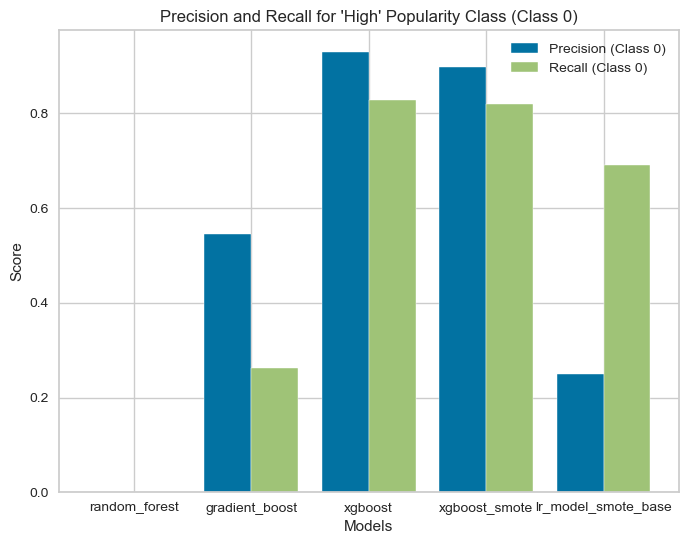

In [191]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import precision_score, recall_score

# 1. Compare models on precision and recall for class 0
plt.figure(figsize=(8, 6))

precision_values = {i: [] for i in range(3)}  # Precision for each class
recall_values = {i: [] for i in range(3)}  # Recall for each class
model_names = []

class_index = 0  # Considering precision and recall for class 0

for model_dict in trained_models:
    model_name = model_dict['model_name']
    y_pred = model_dict['y_pred']  # Predicted labels

    precision = precision_score(y_test_numeric, y_pred, average=None)[class_index]
    recall = recall_score(y_test_numeric, y_pred, average=None)[class_index]

    precision_values[class_index].append(precision)
    recall_values[class_index].append(recall)

    model_names.append(model_name)

# Plot precision and recall for class 0
plt.bar(np.arange(len(model_names)) - 0.2,
        [prec for prec in precision_values[class_index]],
        width=0.4, label=f'Precision (Class {class_index})', align='center')

plt.bar(np.arange(len(model_names)) + 0.2,
        [rec for rec in recall_values[class_index]],
        width=0.4, label=f'Recall (Class {class_index})', align='center')

plt.xticks(np.arange(len(model_names)), model_names)
plt.xlabel('Models')
plt.ylabel('Score')
plt.title("Precision and Recall for 'High' Popularity Class (Class 0)")
plt.legend()
plt.show()

In [186]:
trained_models[1]

{'model_name': 'gradient_boost',
 'best_estimator': GradientBoostingClassifier(learning_rate=1.0, max_depth=4, n_estimators=200,
                            random_state=123),
 'y_pred': array([2, 2, 2, ..., 1, 2, 2]),
 'y_pred_prob': array([[0.0128714 , 0.0356438 , 0.9514848 ],
        [0.00783523, 0.03542029, 0.95674449],
        [0.01032961, 0.02206833, 0.96760206],
        ...,
        [0.2076564 , 0.69934563, 0.09299797],
        [0.05942189, 0.04427866, 0.89629945],
        [0.09719248, 0.07084323, 0.83196429]])}

In [78]:
import shap
from pdpbox import pdp,info_plots

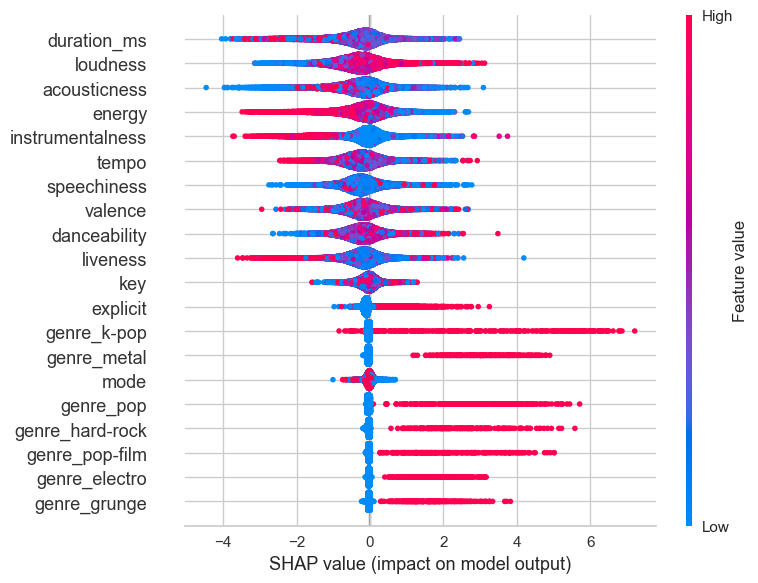

In [196]:
#High Popularity
# Assuming you have an XGBoost model trained (xgb_model) and X_test data
# Make sure to install the necessary libraries: shap, xgboost, pdpbox
# SHAP summary plot
explainer = shap.TreeExplainer(trained_models[2]['best_estimator'])
shap_values = explainer.shap_values(X_test)

# Summary plot for class 1 (adjust class_index accordingly)
shap.summary_plot(shap_values[0], X_test,plot_size=[8,6])

# Partial dependence plot
# Choose the feature for which you want to plot the partial dependence
# feature_name = 'your_feature_name'  # Replace with the actual feature name
# pdp_feature = pdp.pdp_isolate(model=xgb_model_og_best, dataset=X_test, model_features=X_test.columns, feature=feature_name)

# # Plot the partial dependence for class 1 (adjust class_index accordingly)
# pdp.pdp_plot(pdp_feature, feature_name, plot_lines=True, frac_to_plot=0.5)
# plt.title(f'Partial Dependence Plot for {feature_name} (Class 1)')
# plt.show()

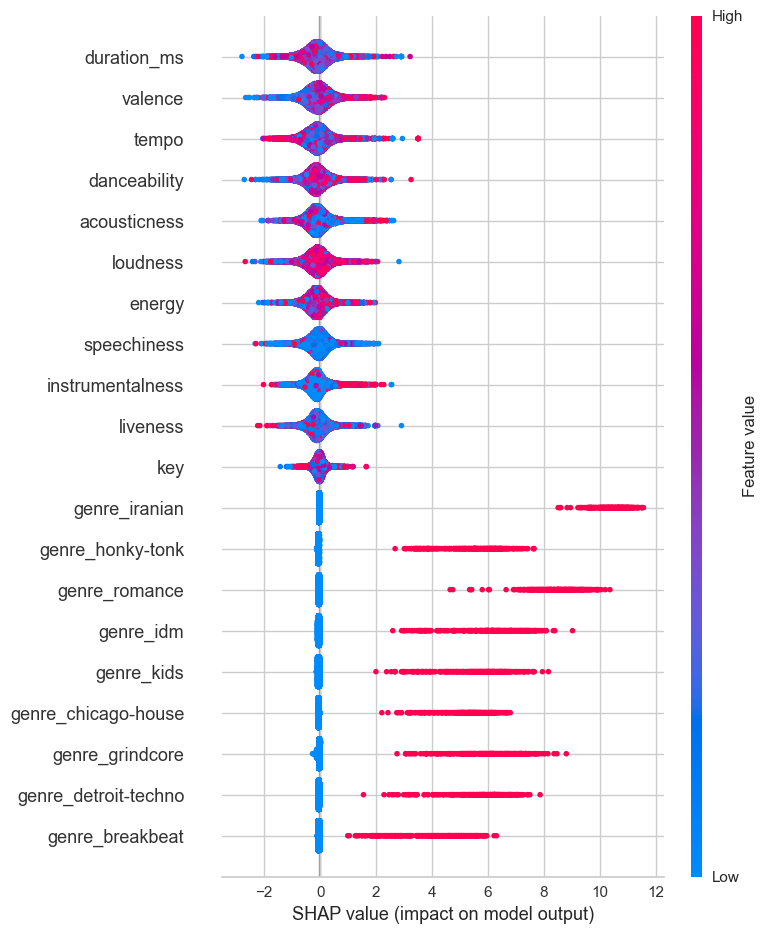

In [82]:
#Low Popularity
# Assuming you have an XGBoost model trained (xgb_model) and X_test data
# Make sure to install the necessary libraries: shap, xgboost, pdpbox

# SHAP summary plot
explainer = shap.TreeExplainer(trained_models[2]['best_estimator'])
shap_values = explainer.shap_values(X_test)

# Summary plot for class 1 (adjust class_index accordingly)
shap.summary_plot(shap_values[1], X_test)

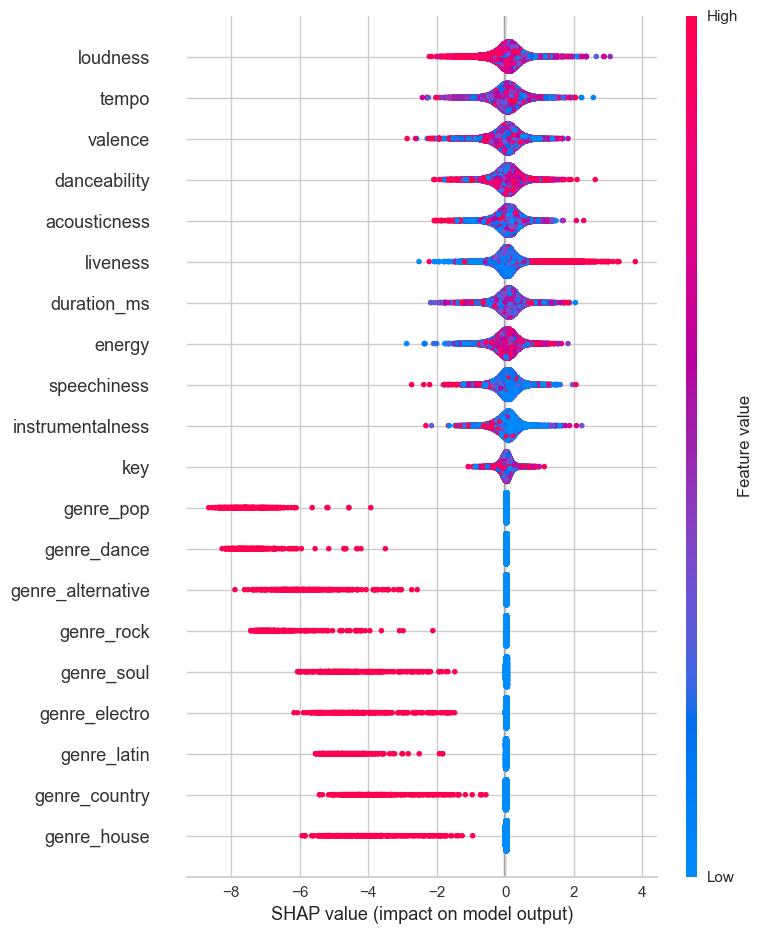

In [83]:
#Medium Popularity
# Assuming you have an XGBoost model trained (xgb_model) and X_test data
# Make sure to install the necessary libraries: shap, xgboost, pdpbox

# SHAP summary plot
explainer = shap.TreeExplainer(trained_models[2]['best_estimator'])
shap_values = explainer.shap_values(X_test)

# Summary plot for class 1 (adjust class_index accordingly)
shap.summary_plot(shap_values[2], X_test)

In [85]:
from sklearn.inspection import PartialDependenceDisplay

In [86]:
from sklearn.inspection import partial_dependence

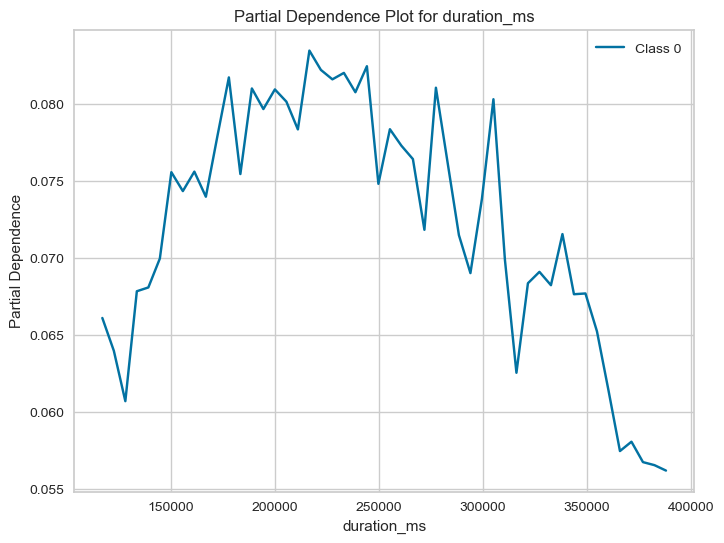

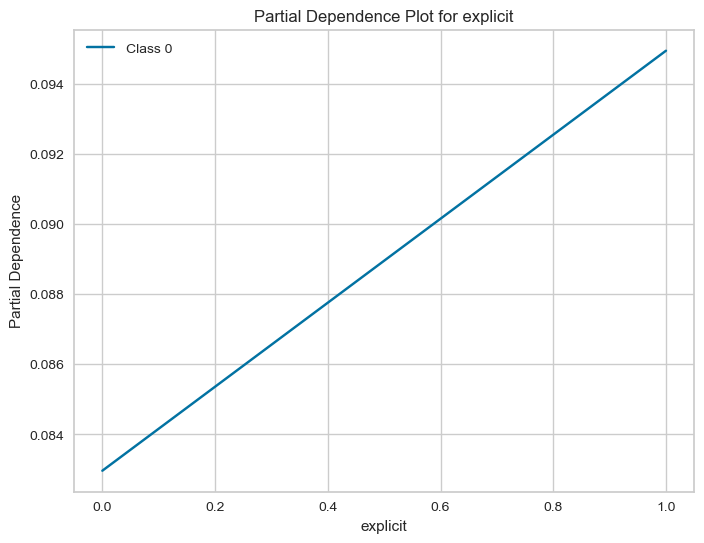

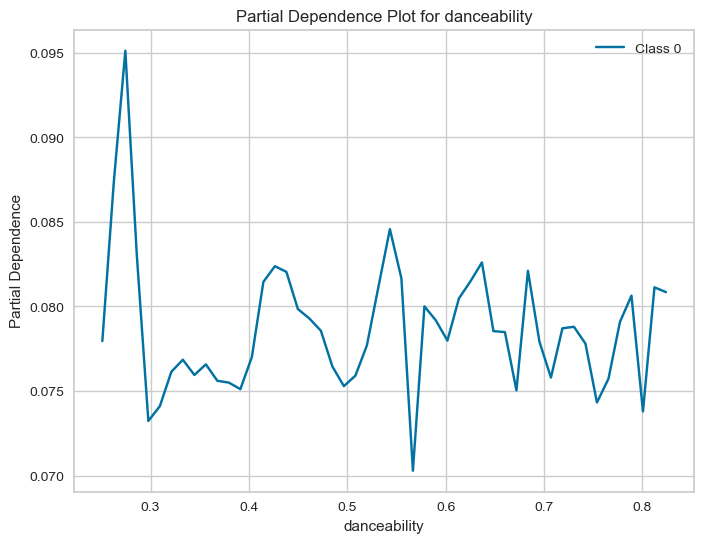

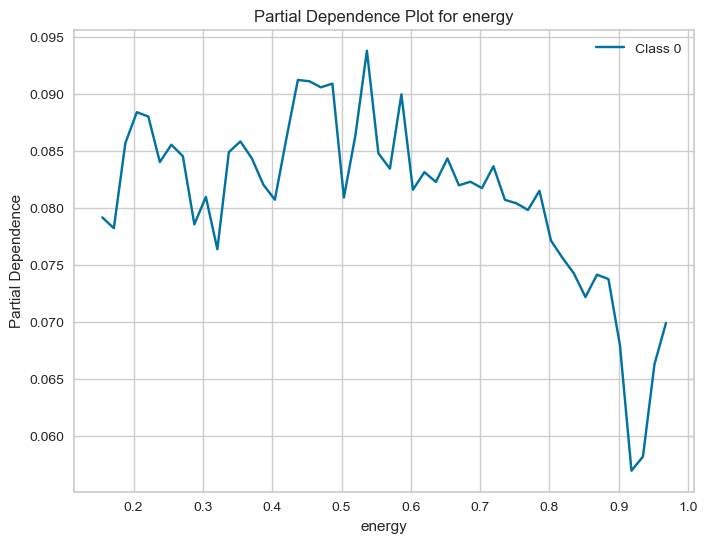

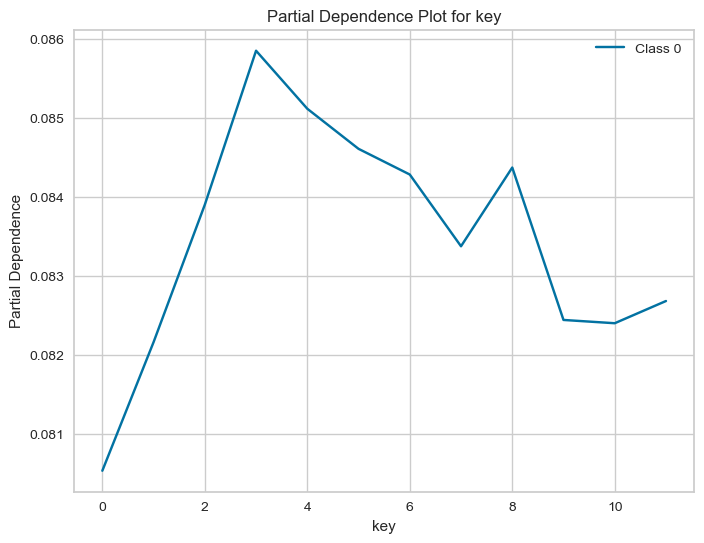

...

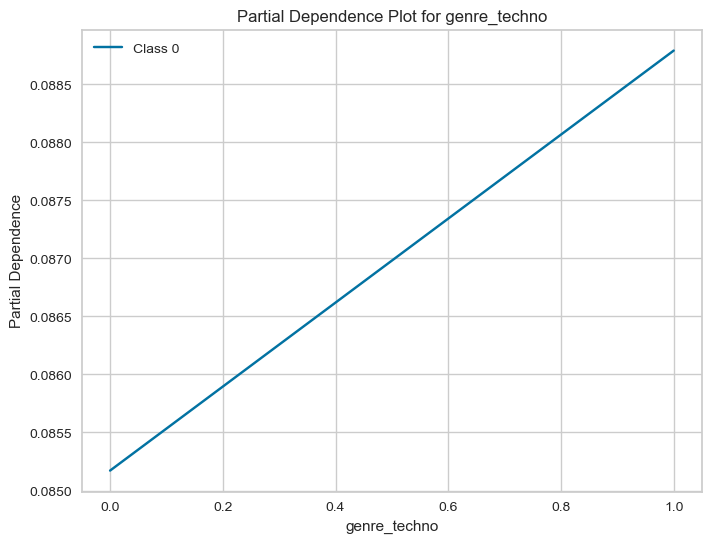

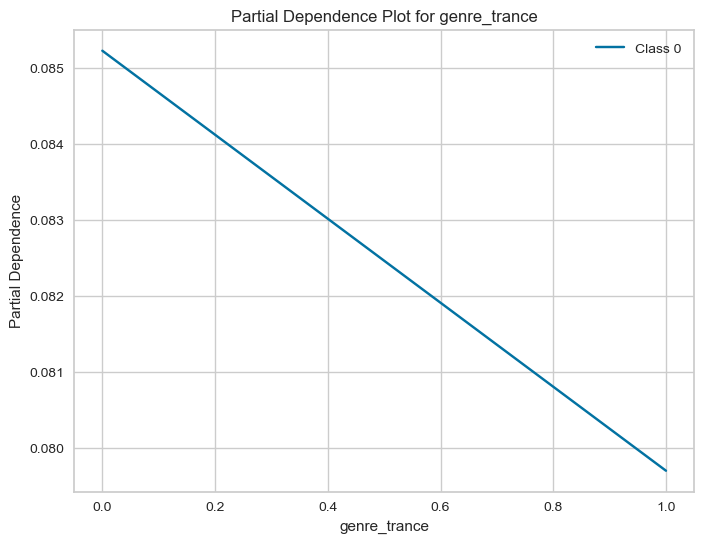

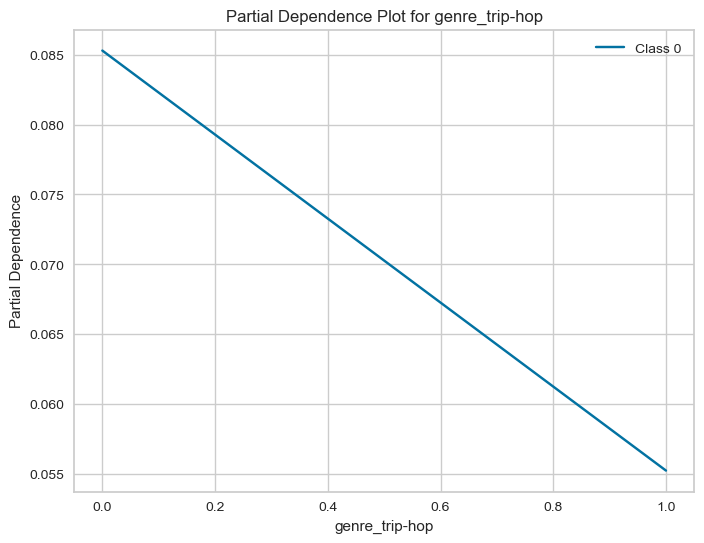

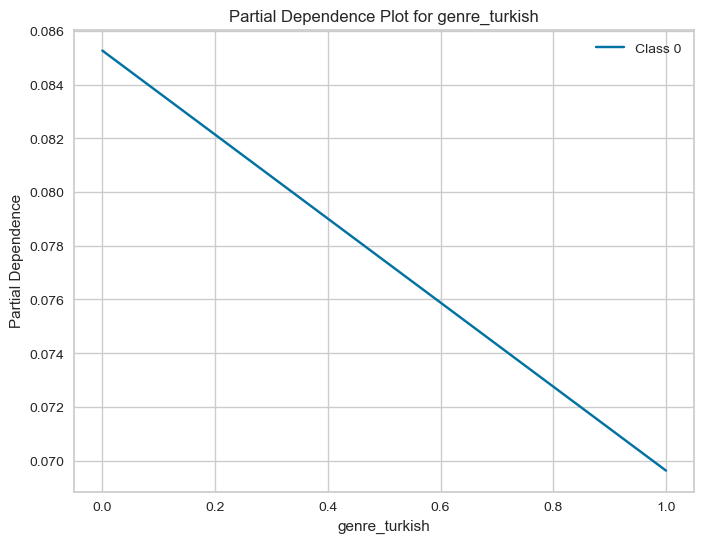

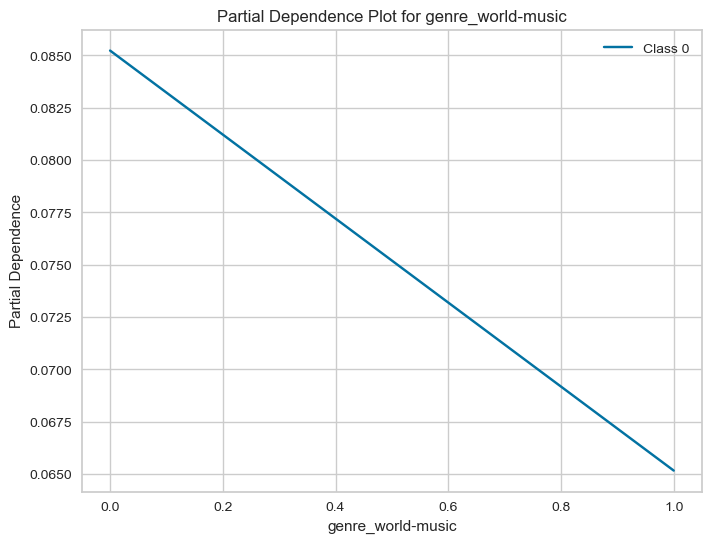

In [87]:
# Assuming xgb_model_og_best is your XGBoost classification model
# xgb_model_og_best = ...

# Loop through all features in X_test
for feature_index, feature_name in enumerate(X_test.columns):
    # Compute partial dependence
    pd_results = partial_dependence(trained_models[2]['best_estimator'], X_test, features=[feature_index], kind="average", grid_resolution=50)

    # Plot the partial dependence for specific classes
    plt.figure(figsize=(8, 6))
    for class_index in [0]:  # Adjust these values based on your classes
        plt.plot(pd_results["values"][0], pd_results["average"][class_index], label=f'Class {class_index}')

    plt.title(f'Partial Dependence Plot for {feature_name}')
    plt.xlabel(feature_name)
    plt.ylabel('Partial Dependence')
    plt.legend()
    plt.show()

In [ ]:
# Loop through all features in X_test
for feature_index, feature_name in enumerate(X_test.columns):
    # Compute partial dependence
    pd_results = partial_dependence(xgb_model_og_best, X_test, features=[feature_index], kind="average", grid_resolution=50)

    # Plot the partial dependence for specific classes
    plt.figure(figsize=(8, 6))
    for class_index in [1]:  # Adjust these values based on your classes
        plt.plot(pd_results["values"][0], pd_results["average"][class_index], label=f'Class {class_index}')

    plt.title(f'Partial Dependence Plot for {feature_name}')
    plt.xlabel(feature_name)
    plt.ylabel('Partial Dependence')
    plt.legend()
    plt.show()